In [4]:
list.of.packages <- c("Seurat", "tidyverse", "Matrix", "reticulate", "taRifx", "data.table")
new.packages <- list.of.packages[!(list.of.packages %in% installed.packages()[,"Package"])]
if(length(new.packages)) install.packages(new.packages)
library(remotes)
remotes::install_github("m-jahn/lattice-tools")
library(lattice)
library(latticetools)
library(latticeExtra)
update.packages(c("Seurat"))
suppressPackageStartupMessages(library(tidyverse))
library(Seurat)
library(Matrix)
library(reticulate)
suppressPackageStartupMessages(library(taRifx))
suppressWarnings(library(data.table, warn.conflicts =FALSE))
library(future)
library(cowplot)
dotenv::load_dot_env()

Skipping install of 'latticetools' from a github remote, the SHA1 (5001dd0b) has not changed since last install.
  Use `force = TRUE` to force installation



ERROR: Error in library(lattice - tools): 'package' must be of length 1


In [7]:
#system(springf('gsutil cp %s/%s .', Sys.getenv("PREDICT_BUCKET"). Sys.getenv("SUBSET_SROBJ_PATH")),intern=T)
srobj <- readRDS('./subset_srobj.rds')
colnames(srobj@meta.data)
srobj

[1] "CellID"                        "ClusterID"                    
 [3] "ClusterName"                   "SCT_snn_res_0_058"            
 [5] "log1p_nFeatures_RNA_by_counts" "log1p_total_counts"           
 [7] "log1p_total_counts_mito"       "nCount_RNA"                   
 [9] "nCount_SCT"                    "nFeature_RNA"                 
[11] "nFeature_SCT"                  "nFeatures_RNA"                
[13] "nFeatures_RNA_by_counts"       "orig_ident"                   
[15] "pct_counts_mito"               "percent_mt"                   
[17] "seurat_clusters"               "total_counts"                 
[19] "total_counts_mito"             "tier0preds"                   
[21] "cellsubsets"                   "celltypes"                    
[23] "is_doublet"                    "cluster"                      
[25] "orig_idx"                      "tier0ident"                   
[27] "tier1ident"                    "tier2ident"                   
[29] "tier3ident"                    "tier4ident"                   
[31] "tierNident"                    "tier0name"                    
[33] "tier1name"                     "tier2name"                    
[35] "tier3name"                     "tier4name"                    
[37] "tierNname"                     "SampleID"                     
[39] "age"                           "ethnicity"                    
[41] "race"                          "sex"                          
[43] "antiTNF_response"              "inflammation"                 
[45] "disease"                       "patient"                      
[47] "time_point"                    "tissue"                       
[49] "prime"                         "diffexpname"                  
[51] "type"                          "curatedname"                  
[53] "cellname"                      "nFeatures_RNA.by.counts"      
[55] "log1p.nFeatures_RNA.by.counts" "total.counts"                 
[57] "log1p.total.counts"            "total.counts.mito"            
[59] "log1p.total.counts.mito"       "pct.counts.mito"              
[61] "orig.ident"                    "percent.mt"                   
[63] "SCT_snn_res.0.067"             "major10types"                 
[65] "endclust"                      "oldannotations"               
[67] "SCT_snn_res.0.139"

An object of class Seurat 
46176 features across 197281 samples within 2 assays 
Active assay: SCT (22431 features, 3000 variable features)
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

In [8]:
srobj@meta.data$SCT_snn_res.0.139 %>% unique

[1] 0  8  6  4  10 3  1  12 14 13 2  7  11 16 15 17 5  9 
Levels: 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17

In [9]:
levels(Idents(srobj))

[1] "0"  "1"  "2"  "3"  "4"  "5"  "6"  "7"  "8"  "9"  "10" "11" "12" "13" "14"
[16] "15" "16" "17"

In [10]:
#system(springf('gsutil cp %s/%s .', Sys.getenv("PREDICT_BUCKET"). Sys.getenv("GI_TYPE_ANNOTATIONS_PATH")),intern=T)
annotations <- readRDS('./GI_TypeAnnotations.rds')


In [11]:
VotiveAnnotate <- function(DEresult,tiers,tier=1,annotationdf) {
  fccol <- grep("FC",colnames(DEresult))
  DEresult %>% 
    mutate(rnkscr = -log(p_val_adj+1e-300) * sapply(DEresult[,fccol], as.numeric) * (pct.1 / (pct.2 + 1e-300))) %>% 
    group_by(cluster) %>% filter(p_val_adj<0.01) %>% top_n(n = 500, wt = rnkscr) -> biomarkers

    tiercol <- grep(paste0("^tier",tier,"$"),colnames(tiers))

    Matchingdf <- data.frame(celltypes=NA,cluster=levels(factor(tiers[,tiercol])))

    possibles <- colnames(annotationdf)
    for (i in 1:length(Matchingdf[,2])){
    matches=list()
    for (id in possibles) {
          matchers <- biomarkers %>% filter(cluster==Matchingdf[i,2]) %>% pull(gene)
      matches <- c(matches,length(match(intersect(matchers,annotationdf[[id]]),matchers)))   
    }   
    bestmatch <- which(matches==max(unlist(matches)))
    if(any(matches!=0)){Matchingdf$celltypes[i]<-possibles[bestmatch[length(bestmatch)]]}
  }
  Matchingdf <- Matchingdf %>% mutate_if(is.character, ~replace(.,is.na(.),'unknown'))
  return(Matchingdf)
}

In [12]:
#system(springf('gsutil cp %s/%s .', Sys.getenv("PREDICT_BUCKET"). Sys.getenv("ALLMARKERS_PATH")),intern=T)
typeDE <- fread('allmarkers.tsv',sep='\t')
typeDE %>% group_by(cluster) %>% top_n(10,avg_log2FC) %>% data.frame

character(0)

p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<chr>
0.000000e+00,2.897689,0.650,0.059,0.000000e+00,0,CD3D
0.000000e+00,2.888198,0.682,0.113,0.000000e+00,0,TRAC
2.999828e-238,2.550571,0.512,0.048,7.123092e-234,0,CD2
7.434679e-234,2.343979,0.488,0.042,1.765364e-229,0,CD3E
6.411607e-211,2.247391,0.661,0.218,1.522436e-206,0,IL32
7.811489e-198,2.122260,0.477,0.056,1.854838e-193,0,CD7
9.601219e-196,2.529444,0.425,0.039,2.279810e-191,0,IL7R
2.132985e-194,2.352071,0.506,0.110,5.064774e-190,0,TRBC2
5.697922e-191,2.800293,0.450,0.051,1.352972e-186,0,TRBC1


In [13]:
typeDE <- typeDE %>% mutate(cluster=paste0('T1C',typeDE$cluster)) %>% data.frame
head(typeDE)

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
1,0.000000e+00,2.8976889,0.650,0.059,0.000000e+00,T1C0,CD3D
2,0.000000e+00,2.8881978,0.682,0.113,0.000000e+00,T1C0,TRAC
3,2.999828e-238,2.5505714,0.512,0.048,7.123092e-234,T1C0,CD2
4,7.434679e-234,2.3439785,0.488,0.042,1.765364e-229,T1C0,CD3E
5,1.039782e-233,0.9693864,0.995,0.974,2.468963e-229,T1C0,MALAT1
6,6.411607e-211,2.2473907,0.661,0.218,1.522436e-206,T1C0,IL32


In [14]:
library(parallel)
parallel::detectCores()

[1] 96

In [15]:
tiers <- srobj@meta.data %>% mutate(tier1 = paste0("T1C",Idents(srobj)))
head(tiers)
head(annotations)

,CellID,ClusterID,ClusterName,SCT_snn_res_0_058,log1p_nFeatures_RNA_by_counts,log1p_total_counts,log1p_total_counts_mito,nCount_RNA,nCount_SCT,nFeature_RNA,⋯,log1p.total.counts.mito,pct.counts.mito,orig.ident,percent.mt,SCT_snn_res.0.067,major10types,endclust,oldannotations,SCT_snn_res.0.139,tier1
,<chr>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,⋯,<dbl>,<dbl>,<chr>,<dbl>,<int>,<chr>,<chr>,<chr>,<fct>,<chr>
p011_T0D_ILE_LPS_3p_AAACCTGAGAGTCTGG-1,p011_T0D_ILE_LPS_3p_AAACCTGAGAGTCTGG-1,1,0,0,5.886104,6.573680,4.927254,715,1189,359,⋯,NA,NA,NA,20.8831647,NA,NA,NA,NA,0,T1C0
p011_T0D_ILE_LPS_3p_AAACCTGAGGCAAAGA-1,p011_T0D_ILE_LPS_3p_AAACCTGAGGCAAAGA-1,8,7,7,7.271008,9.513182,5.438079,13536,2730,1437,⋯,NA,NA,NA,1.6430412,NA,NA,NA,NA,8,T1C8
p011_T0D_ILE_LPS_3p_AAACCTGAGTGGACGT-1,p011_T0D_ILE_LPS_3p_AAACCTGAGTGGACGT-1,1,0,0,5.493062,6.352629,5.062595,573,1222,242,⋯,NA,NA,NA,25.9226714,NA,NA,NA,NA,0,T1C0
p011_T0D_ILE_LPS_3p_AAACCTGCACACTGCG-1,p011_T0D_ILE_LPS_3p_AAACCTGCACACTGCG-1,1,0,0,6.678342,7.371490,4.330733,1589,1615,794,⋯,NA,NA,NA,4.7080979,NA,NA,NA,NA,6,T1C6
p011_T0D_ILE_LPS_3p_AAACCTGGTCCATGAT-1,p011_T0D_ILE_LPS_3p_AAACCTGGTCCATGAT-1,5,4,4,7.497207,9.722145,4.820282,16680,2909,1800,⋯,NA,NA,NA,0.5830904,NA,NA,NA,NA,4,T1C4
p011_T0D_ILE_LPS_3p_AAACCTGGTGTATGGG-1,p011_T0D_ILE_LPS_3p_AAACCTGGTGTATGGG-1,9,8,8,6.733402,7.672292,4.174387,2147,1956,839,⋯,NA,NA,NA,2.7921406,NA,NA,NA,NA,10,T1C10


,T,B,EC,Myeloid,Fibro,Endth,Glial,Mstcl,Plsma.IGA.IGK,Plsma.IGA.IGL,Plsma.IGG,Plsma.IGM
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
1,TRAC,RPS27,KRT18,HLA-DRA,LUM,SPARCL1,PLP1,TPSB2,IGKV1-12,IGLC2,IGHG1,IGHM
2,PTPRC,MS4A1,SPINK1,CD74,C1S,PLVAP,CRYAB,TPSAB1,IGKV3-15,IGLV3-21,IGHG3,JCHAIN
3,CD2,BANK1,KRT8,AIF1,CALD1,FABP5,CLU,CPA3,IGKV1-5,IGLC3,IGHG2,IGHMBP2
4,TRBC1,CXCR4,AGR2,CST3,CXCL14,CLDN5,SCN7A,HPGDS,IGKV4-1,IGHA1,IGHG4,NA
5,TRBC2,CD52,REG1A,TMSB4X,ADAMDEC1,CAV1,SPARC,ANXA1,IGKC,IGLL5,IGHGP,NA
6,MALAT1,VPREB3,MT1G,LYZ,CFD,GNG11,CD9,LMNA,IGHA1,IGLC1,NA,NA


In [16]:
type <- VotiveAnnotate(typeDE,tiers,tier=1,annotations)

In [17]:
type

celltypes,cluster
<chr>,<chr>
T,T1C0
B,T1C1
Mstcl,T1C10
Plsma.IGG,T1C11
Plsma.IGA.IGK,T1C12
Endth,T1C13
Plsma.IGG,T1C14
Plsma.IGA.IGL,T1C15
Plsma.IGM,T1C16


In [18]:
type

celltypes,cluster
<chr>,<chr>
T,T1C0
B,T1C1
Mstcl,T1C10
Plsma.IGG,T1C11
Plsma.IGA.IGK,T1C12
Endth,T1C13
Plsma.IGG,T1C14
Plsma.IGA.IGL,T1C15
Plsma.IGM,T1C16


In [19]:
ifelse(any(colnames(srobj@meta.data)=="CellID"), srobj@meta.data <- srobj@meta.data, srobj@meta.data$CellID <- rownames(srobj@meta.data))
Idents(srobj) <- srobj@meta.data %>% mutate(tier1 = paste0("T1C",srobj@meta.data$SCT_snn_res.0.139)) %>% pull(tier1)
levels(Idents(srobj))

[[1]]
    [1] "p011_T0D_ILE_LPS_3p_AAACCTGAGAGTCTGG-1"
    [2] "p011_T0D_ILE_LPS_3p_AAACCTGAGGCAAAGA-1"
    [3] "p011_T0D_ILE_LPS_3p_AAACCTGAGTGGACGT-1"
    [4] "p011_T0D_ILE_LPS_3p_AAACCTGCACACTGCG-1"
    [5] "p011_T0D_ILE_LPS_3p_AAACCTGGTCCATGAT-1"
    [6] "p011_T0D_ILE_LPS_3p_AAACCTGGTGTATGGG-1"
    [7] "p011_T0D_ILE_LPS_3p_AAACCTGGTTGATTCG-1"
    [8] "p011_T0D_ILE_LPS_3p_AAACCTGTCCCATTAT-1"
    [9] "p011_T0D_ILE_LPS_3p_AAACGGGAGAGTGACC-1"
   [10] "p011_T0D_ILE_LPS_3p_AAACGGGAGGACGAAA-1"
   [11] "p011_T0D_ILE_LPS_3p_AAACGGGAGGTGGGTT-1"
   [12] "p011_T0D_ILE_LPS_3p_AAACGGGAGTCACGCC-1"
   [13] "p011_T0D_ILE_LPS_3p_AAACGGGCAAGTACCT-1"
   [14] "p011_T0D_ILE_LPS_3p_AAACGGGCACTAAGTC-1"
   [15] "p011_T0D_ILE_LPS_3p_AAACGGGCATACAGCT-1"
   [16] "p011_T0D_ILE_LPS_3p_AAACGGGCATGCCCGA-1"
   [17] "p011_T0D_ILE_LPS_3p_AAACGGGCATGTCTCC-1"
   [18] "p011_T0D_ILE_LPS_3p_AAACGGGGTCACACGC-1"
   [19] "p011_T0D_ILE_LPS_3p_AAACGGGGTCCGTCAG-1"
   [20] "p011_T0D_ILE_LPS_3p_AAACGGGGTGATAAGT-1"
   [21] "p011_T0D_ILE_LPS_3p_AAACGGGTCCTGCAGG-1"
   [22] "p011_T0D_ILE_LPS_3p_AAACGGGTCGCCAGCA-1"
   [23] "p011_T0D_ILE_LPS_3p_AAACGGGTCTAACTGG-1"
   [24] "p011_T0D_ILE_LPS_3p_AAAGATGAGAGACTAT-1"
   [25] "p011_T0D_ILE_LPS_3p_AAAGATGCAAGACGTG-1"
   [26] "p011_T0D_ILE_LPS_3p_AAAGATGCACATCTTT-1"
   [27] "p011_T0D_ILE_LPS_3p_AAAGATGCACCGGAAA-1"
   [28] "p011_T0D_ILE_LPS_3p_AAAGATGCAGGACCCT-1"
   [29] "p011_T0D_ILE_LPS_3p_AAAGATGCATTAGGCT-1"
   [30] "p011_T0D_ILE_LPS_3p_AAAGATGCATTGGGCC-1"
   [31] "p011_T0D_ILE_LPS_3p_AAAGATGGTAAATGAC-1"
   [32] "p011_T0D_ILE_LPS_3p_AAAGATGGTCAGGACA-1"
   [33] "p011_T0D_ILE_LPS_3p_AAAGATGTCAACGGGA-1"
   [34] "p011_T0D_ILE_LPS_3p_AAAGATGTCATGTCTT-1"
   [35] "p011_T0D_ILE_LPS_3p_AAAGCAAAGAATCTCC-1"
   [36] "p011_T0D_ILE_LPS_3p_AAAGCAAAGAATGTGT-1"
   [37] "p011_T0D_ILE_LPS_3p_AAAGCAACAACTGGCC-1"
   [38] "p011_T0D_ILE_LPS_3p_AAAGCAACAGTATCTG-1"
   [39] "p011_T0D_ILE_LPS_3p_AAAGCAACATAGACTC-1"
   [40] "p011_T0D_ILE_LPS_3p_AAAGCAACATGTCTCC-1"
   [41] "p011_T0D_ILE_LPS_3p_AAAGCAAGTAAGTAGT-1"
   [42] "p011_T0D_ILE_LPS_3p_AAAGCAAGTTATCCGA-1"
   [43] "p011_T0D_ILE_LPS_3p_AAAGCAAGTTCCGTCT-1"
   [44] "p011_T0D_ILE_LPS_3p_AAAGCAAGTTGCCTCT-1"
   [45] "p011_T0D_ILE_LPS_3p_AAAGCAATCCTATGTT-1"
   [46] "p011_T0D_ILE_LPS_3p_AAAGCAATCTATCCCG-1"
   [47] "p011_T0D_ILE_LPS_3p_AAAGTAGAGAAGGACA-1"
   [48] "p011_T0D_ILE_LPS_3p_AAAGTAGAGATGCGAC-1"
   [49] "p011_T0D_ILE_LPS_3p_AAAGTAGAGCGGCTTC-1"
   [50] "p011_T0D_ILE_LPS_3p_AAAGTAGAGTACGACG-1"
   [51] "p011_T0D_ILE_LPS_3p_AAAGTAGCAAGGCTCC-1"
   [52] "p011_T0D_ILE_LPS_3p_AAAGTAGCACGTCAGC-1"
   [53] "p011_T0D_ILE_LPS_3p_AAAGTAGCACTATCTT-1"
   [54] "p011_T0D_ILE_LPS_3p_AAAGTAGCAGACAAGC-1"
   [55] "p011_T0D_ILE_LPS_3p_AAAGTAGCAGGGAGAG-1"
   [56] "p011_T0D_ILE_LPS_3p_AAAGTAGCATGAGCGA-1"
   [57] "p011_T0D_ILE_LPS_3p_AAAGTAGGTCTCTTAT-1"
   [58] "p011_T0D_ILE_LPS_3p_AAAGTAGTCATGTAGC-1"
   [59] "p011_T0D_ILE_LPS_3p_AAAGTAGTCGCCAAAT-1"
   [60] "p011_T0D_ILE_LPS_3p_AAAGTAGTCTGGCGAC-1"
   [61] "p011_T0D_ILE_LPS_3p_AAATGCCAGCCACCTG-1"
   [62] "p011_T0D_ILE_LPS_3p_AAATGCCAGGAACTGC-1"
   [63] "p011_T0D_ILE_LPS_3p_AAATGCCAGGACACCA-1"
   [64] "p011_T0D_ILE_LPS_3p_AAATGCCAGGTAAACT-1"
   [65] "p011_T0D_ILE_LPS_3p_AAATGCCAGTATCGAA-1"
   [66] "p011_T0D_ILE_LPS_3p_AAATGCCCAGCCTTTC-1"
   [67] "p011_T0D_ILE_LPS_3p_AAATGCCGTACAAGTA-1"
   [68] "p011_T0D_ILE_LPS_3p_AAATGCCGTACCGCTG-1"
   [69] "p011_T0D_ILE_LPS_3p_AAATGCCGTACGCACC-1"
   [70] "p011_T0D_ILE_LPS_3p_AAATGCCGTCTAACGT-1"
   [71] "p011_T0D_ILE_LPS_3p_AAATGCCGTTCCGGCA-1"
   [72] "p011_T0D_ILE_LPS_3p_AAATGCCTCACCCTCA-1"
   [73] "p011_T0D_ILE_LPS_3p_AAATGCCTCCAACCAA-1"
   [74] "p011_T0D_ILE_LPS_3p_AAATGCCTCCACGCAG-1"
   [75] "p011_T0D_ILE_LPS_3p_AAATGCCTCCATTCTA-1"
   [76] "p011_T0D_ILE_LPS_3p_AAATGCCTCCGTTGCT-1"
   [77] "p011_T0D_ILE_LPS_3p_AAATGCCTCTACCTGC-1"
   [78] "p011_T0D_ILE_LPS_3p_AAATGCCTCTGCGACG-1"
   [79] "p011_T0D_ILE_LPS_3p_AAATGCCTCTTACCGC-1"
   [80] "p011_T0D_ILE_LPS_3p_AACACGTAGAGTCTGG-1"
   [81] "p011_T0D_ILE_LPS_3p_AACACGTCACAGCGTC-1"
   [82] "p011_T0D_ILE_LPS

[1] "T1C0"  "T1C8"  "T1C6"  "T1C4"  "T1C10" "T1C3"  "T1C1"  "T1C12" "T1C14"
[10] "T1C13" "T1C2"  "T1C7"  "T1C11" "T1C16" "T1C15" "T1C17" "T1C5"  "T1C9"

In [20]:
IdentityRenamingList <- split(type$celltypes,type$cluster)
srobj <- RenameIdents(srobj, IdentityRenamingList)
srobj@meta.data$combinedmajortype <- Idents(srobj)
levels(Idents(srobj))

[1] "T"             "B"             "Mstcl"         "Plsma.IGG"    
 [5] "Plsma.IGA.IGK" "Endth"         "Plsma.IGA.IGL" "Plsma.IGM"    
 [9] "EC"            "Myeloid"       "Fibro"

In [21]:
library(patchwork)
library(RColorBrewer)


Attaching package: ‘patchwork’


The following object is masked from ‘package:cowplot’:

    align_plots




In [22]:
srobj@meta.data$celltypes <- srobj@meta.data$celltypes %>% str_replace_all('Tclls','T')%>% str_replace_all('Bclls','B')%>% str_replace_all('Mloid','Myeloid')%>% str_replace_all('IGM_Plsma','Plsma.IGM')%>% str_replace_all('IGG_Plsma_Bcll','IGG.Plsma.B')%>% str_replace_all('IGA_Plsma','Plsma.IGA')%>% str_replace_all('IGA_IGL_Plsma','Plsma.IGA.IGL')%>% str_replace_all('IGA_IGK_Plsma','Plsma.IGA.IGK')%>% str_replace_all('IGG_Plsma','Plsma.IGG')%>% str_replace_all('Epith','EC')

In [23]:
srobj@meta.data$celltypes %>% unique

[1] "T"             "Plsma.IGA.IGL" "Plsma.IGA"     "Mstcl"        
 [5] "EC"            "Plsma.IGM"     "B"             "Plsma.IGG"    
 [9] "Endth"         "Myeloid"       "Fibro"         "Paneth"       
[13] "Glial"         "IGG.Plsma.B"   "Plsma.IGA.IGK"

In [24]:
celltype_colors = c(EC = '#3BA63B', Fibro = '#D62728', Paneth = '#99C699',
                Endth = '#FF9B45', Myeloid = '#8C564B', Mstcl = '#E586C8',
                T = '#1ABECF', B = '#1F77B4', Plsma.IGA.IGL= '#7F7F7F',
                Plsma.IGA.IGK = '#7F7F7F', Plsma.IGG = '#3F3F3F', Plsma.IGM= '#BFBFBF',
                Glial = "#E76BF3", IGG.Plsma.B= '#3F3F3F',Plsma.IGA='#7F7F7F')

In [33]:
srobj <- RunUMAP(srobj, dims = 1:50, assay = "RNA", n.neighbors=50, min.dist = 1)


14:09:01 UMAP embedding parameters a = 0.115 b = 1.929

14:09:01 Read 197281 rows and found 50 numeric columns

14:09:01 Using Annoy for neighbor search, n_neighbors = 50

14:09:01 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

14:09:58 Writing NN index file to temp file /tmp/RtmpVr5SwA/file2b5ee307d4

14:09:58 Searching Annoy index using 1 thread, search_k = 5000

14:13:04 Annoy recall = 100%

14:13:04 Commencing smooth kNN distance calibration using 1 thread

14:13:25 Initializing from normalized Laplacian + noise

14:15:43 Commencing optimization for 200 epochs, with 14947450 positive edges

14:18:25 Optimization finished



Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



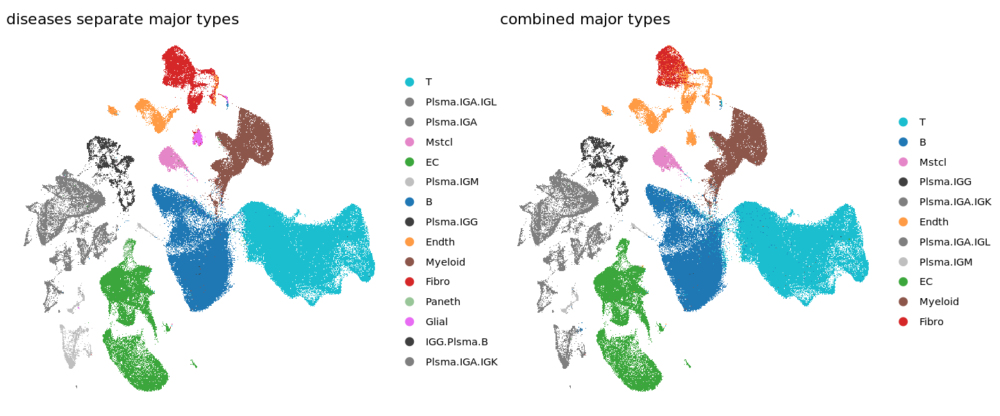

In [19]:
#PCs=1:50, n.neighbors 100, min.dist = 0.5
Idents(srobj) <- srobj@meta.data$celltypes
#d1 <- DimPlot(srobj,reduction='umap',cols=c("#F8766D","#E58700","#C99800","#A3A500","#6BB100","#00BA38","#00BF7D","#00C0AF","#00BCD8","#00B0F6",
#"#619CFF","#B983FF","#E76BF3","#FD61D1","#FF67A4")) + ggtitle('diseases separate major types') + theme_void()

d1 <- DimPlot(srobj,reduction='umap',cols=celltype_colors) + ggtitle('diseases separate major types') + theme_void()


Idents(srobj) <- srobj@meta.data$combinedmajortype
options(repr.plot.width=12, repr.plot.height=5)
#d2 <- DimPlot(srobj,reduction='umap',cols=c("#F8766D","#00BF7D","#A3A500","#00C0AF","#FF67A4","#00BCD8","#E58700","#00BA38","#6BB100","#00B0F6","#619CFF")) + ggtitle('combined major types') + theme_void()
d2 <- DimPlot(srobj,reduction='umap',cols=celltype_colors) + ggtitle('combined major types') + theme_void()



d1+d2

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



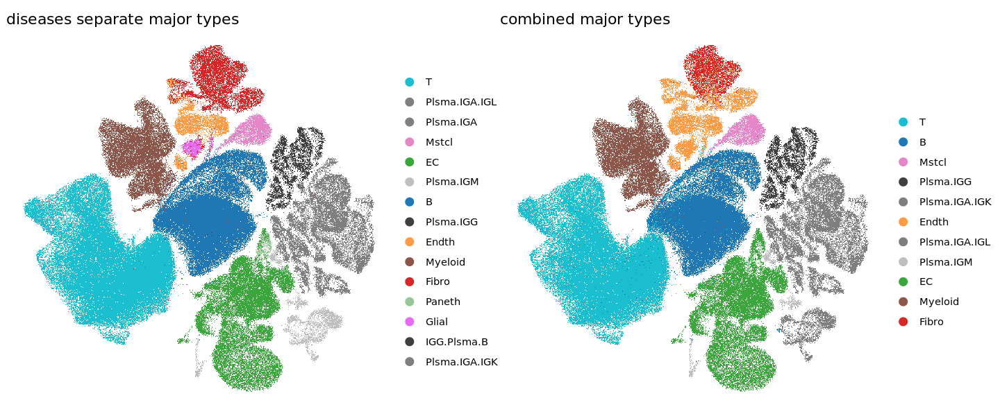

In [54]:
#PCs=1:50, n.neighbors 50, min.dist = 1
Idents(srobj) <- srobj@meta.data$celltypes
d1 <- DimPlot(srobj,reduction='umap',cols=celltype_colors) + ggtitle('diseases separate major types') + theme_void()


Idents(srobj) <- srobj@meta.data$combinedmajortype
options(repr.plot.width=12, repr.plot.height=5)
d2 <- DimPlot(srobj,reduction='umap',cols=celltype_colors) + ggtitle('combined major types') + theme_void()



d1+d2


Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



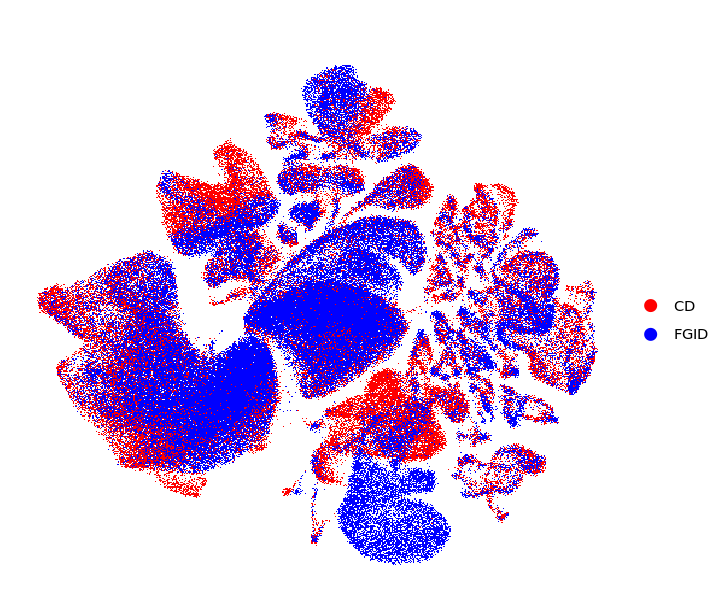

In [41]:
#Colored by disease
Idents(srobj) <- srobj@meta.data$disease

options(repr.plot.width=6, repr.plot.height=5)
d3 <- DimPlot(srobj,reduction='umap',cols=c('#FF0000','#0000FF')) + ggtitle(' ') + theme_void()

d3

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



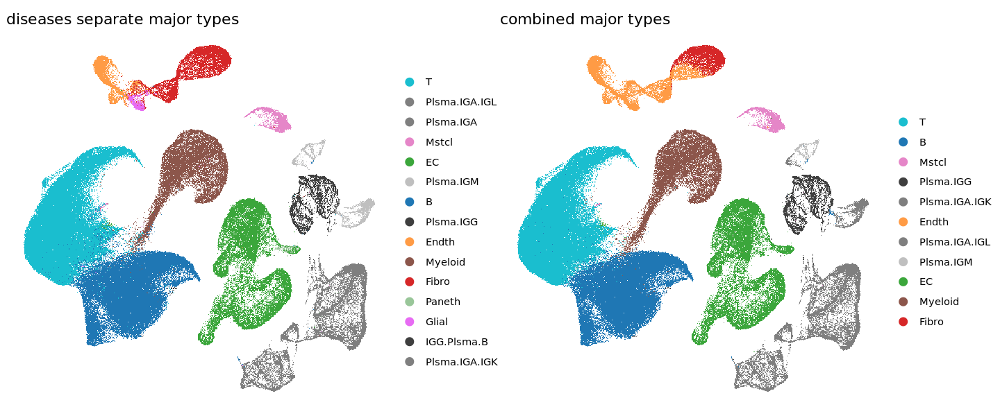

In [18]:
#Original TCA UMAP 

Idents(srobj) <- srobj@meta.data$celltypes
#d1 <- DimPlot(srobj,reduction='umap',cols=c("#F8766D","#E58700","#C99800","#A3A500","#6BB100","#00BA38","#00BF7D","#00C0AF","#00BCD8","#00B0F6",
#"#619CFF","#B983FF","#E76BF3","#FD61D1","#FF67A4")) + ggtitle('diseases separate major types') + theme_void()

d1 <- DimPlot(srobj,reduction='umap',cols=celltype_colors) + ggtitle('diseases separate major types') + theme_void()


Idents(srobj) <- srobj@meta.data$combinedmajortype
options(repr.plot.width=12, repr.plot.height=5)
#d2 <- DimPlot(srobj,reduction='umap',cols=c("#F8766D","#00BF7D","#A3A500","#00C0AF","#FF67A4","#00BCD8","#E58700","#00BA38","#6BB100","#00B0F6","#619CFF")) + ggtitle('combined major types') + theme_void()
d2 <- DimPlot(srobj,reduction='umap',cols=celltype_colors) + ggtitle('combined major types') + theme_void()



d1+d2

In [ ]:
srobj <- RunTSNE(srobj, 
                 initialization = srobj@reductions$pca@cell.embeddings[, 1:2],
                 perplexity = 100,
                 learning_rate = 2000,
                 exaggeration = 10,
                 dims = 1:12,
                 #tsne.method = "FIt-SNE",
                 #fast_tsne_path = "~/bin/fast_tsne",
                 verbose=TRUE
                 )

In [90]:
srobj

An object of class Seurat 
46176 features across 197281 samples within 2 assays 
Active assay: SCT (22431 features, 3000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, tsne

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



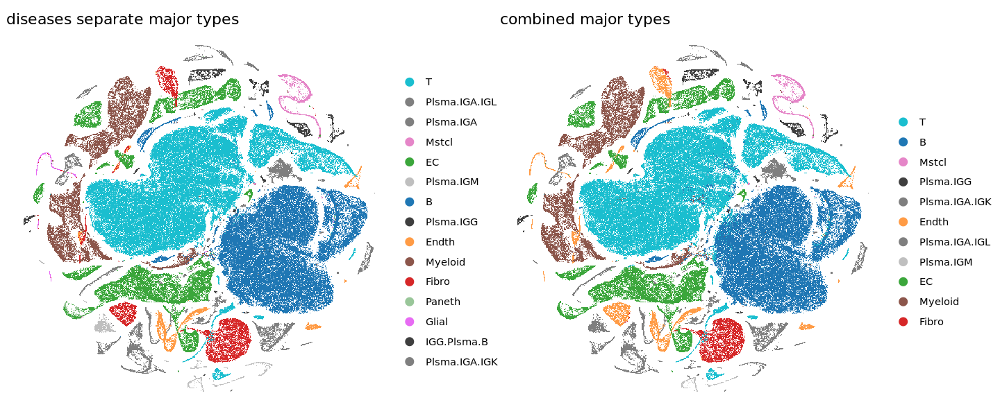

In [91]:
#dims = 1:22, perplexity = 30, learning_rate = ncol(srobj)/12

Idents(srobj) <- srobj@meta.data$celltypes
#d1 <- DimPlot(srobj,reduction='umap',cols=c("#F8766D","#E58700","#C99800","#A3A500","#6BB100","#00BA38","#00BF7D","#00C0AF","#00BCD8","#00B0F6",
#"#619CFF","#B983FF","#E76BF3","#FD61D1","#FF67A4")) + ggtitle('diseases separate major types') + theme_void()

d3 <- DimPlot(srobj,reduction='tsne',cols=celltype_colors) + ggtitle('diseases separate major types') + theme_void()


Idents(srobj) <- srobj@meta.data$combinedmajortype
options(repr.plot.width=12, repr.plot.height=5)
#d2 <- DimPlot(srobj,reduction='umap',cols=c("#F8766D","#00BF7D","#A3A500","#00C0AF","#FF67A4","#00BCD8","#E58700","#00BA38","#6BB100","#00B0F6","#619CFF")) + ggtitle('combined major types') + theme_void()
d4 <- DimPlot(srobj,reduction='tsne',cols=celltype_colors) + ggtitle('combined major types') + theme_void()



d3+d4

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



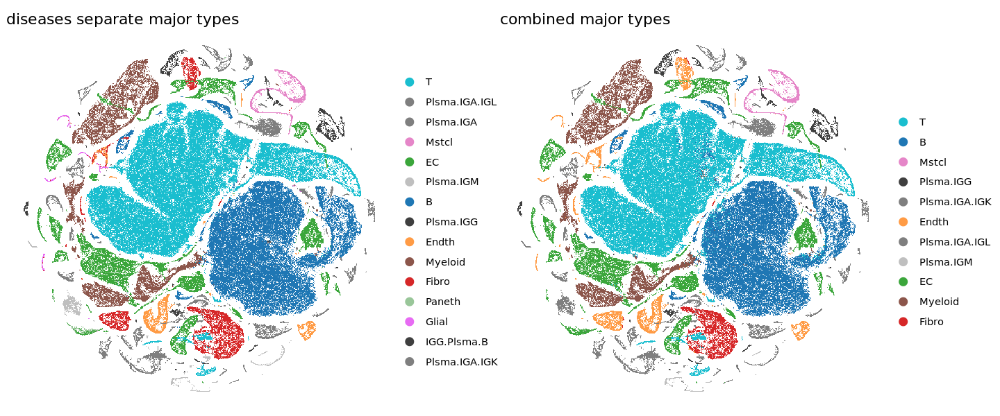

In [18]:
#dims = 1:20, perplexity = 20, learning_rate = ncol(srobj)/12 - hardly changed

Idents(srobj) <- srobj@meta.data$celltypes
#d1 <- DimPlot(srobj,reduction='umap',cols=c("#F8766D","#E58700","#C99800","#A3A500","#6BB100","#00BA38","#00BF7D","#00C0AF","#00BCD8","#00B0F6",
#"#619CFF","#B983FF","#E76BF3","#FD61D1","#FF67A4")) + ggtitle('diseases separate major types') + theme_void()

d3 <- DimPlot(srobj,reduction='tsne',cols=celltype_colors) + ggtitle('diseases separate major types') + theme_void()


Idents(srobj) <- srobj@meta.data$combinedmajortype
options(repr.plot.width=12, repr.plot.height=5)
#d2 <- DimPlot(srobj,reduction='umap',cols=c("#F8766D","#00BF7D","#A3A500","#00C0AF","#FF67A4","#00BCD8","#E58700","#00BA38","#6BB100","#00B0F6","#619CFF")) + ggtitle('combined major types') + theme_void()
d4 <- DimPlot(srobj,reduction='tsne',cols=celltype_colors) + ggtitle('combined major types') + theme_void()



d3+d4

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



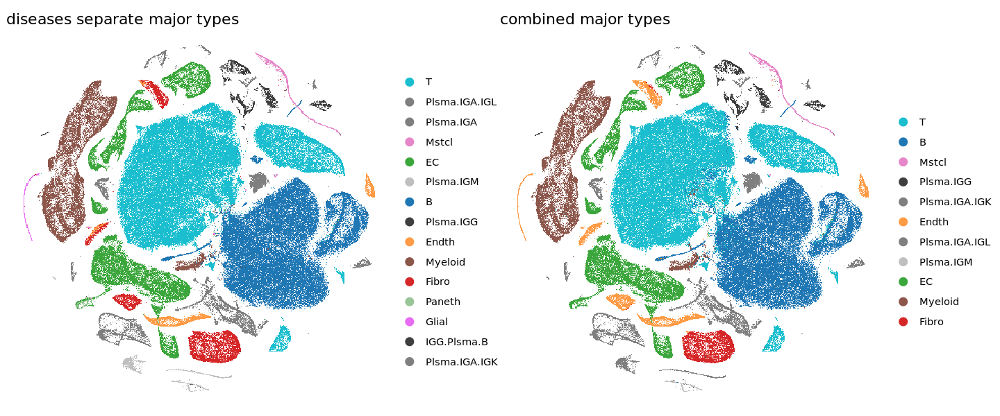

In [20]:
#dims = 1:20, perplexity = 100, exaggeration = 20, no initialization, learning_rate = 2000
Idents(srobj) <- srobj@meta.data$celltypes
#d1 <- DimPlot(srobj,reduction='umap',cols=c("#F8766D","#E58700","#C99800","#A3A500","#6BB100","#00BA38","#00BF7D","#00C0AF","#00BCD8","#00B0F6",
#"#619CFF","#B983FF","#E76BF3","#FD61D1","#FF67A4")) + ggtitle('diseases separate major types') + theme_void()

d3 <- DimPlot(srobj,reduction='tsne',cols=celltype_colors) + ggtitle('diseases separate major types') + theme_void()


Idents(srobj) <- srobj@meta.data$combinedmajortype
options(repr.plot.width=12, repr.plot.height=5)
#d2 <- DimPlot(srobj,reduction='umap',cols=c("#F8766D","#00BF7D","#A3A500","#00C0AF","#FF67A4","#00BCD8","#E58700","#00BA38","#6BB100","#00B0F6","#619CFF")) + ggtitle('combined major types') + theme_void()
d4 <- DimPlot(srobj,reduction='tsne',cols=celltype_colors) + ggtitle('combined major types') + theme_void()



d3+d4

In [ ]:
#dims = 1:20, perplexity = 2000, exaggeration = 20, no initialization, learning_rate = 2000
Idents(srobj) <- srobj@meta.data$celltypes
#d1 <- DimPlot(srobj,reduction='umap',cols=c("#F8766D","#E58700","#C99800","#A3A500","#6BB100","#00BA38","#00BF7D","#00C0AF","#00BCD8","#00B0F6",
#"#619CFF","#B983FF","#E76BF3","#FD61D1","#FF67A4")) + ggtitle('diseases separate major types') + theme_void()

d3 <- DimPlot(srobj,reduction='tsne',cols=celltype_colors) + ggtitle('diseases separate major types') + theme_void()


Idents(srobj) <- srobj@meta.data$combinedmajortype
options(repr.plot.width=12, repr.plot.height=5)
#d2 <- DimPlot(srobj,reduction='umap',cols=c("#F8766D","#00BF7D","#A3A500","#00C0AF","#FF67A4","#00BCD8","#E58700","#00BA38","#6BB100","#00B0F6","#619CFF")) + ggtitle('combined major types') + theme_void()
d4 <- DimPlot(srobj,reduction='tsne',cols=celltype_colors) + ggtitle('combined major types') + theme_void()



d3+d4

In [32]:
colnames(srobj@meta.data)

[1] "CellID"                        "ClusterID"                    
 [3] "ClusterName"                   "SCT_snn_res_0_058"            
 [5] "log1p_nFeatures_RNA_by_counts" "log1p_total_counts"           
 [7] "log1p_total_counts_mito"       "nCount_RNA"                   
 [9] "nCount_SCT"                    "nFeature_RNA"                 
[11] "nFeature_SCT"                  "nFeatures_RNA"                
[13] "nFeatures_RNA_by_counts"       "orig_ident"                   
[15] "pct_counts_mito"               "percent_mt"                   
[17] "seurat_clusters"               "total_counts"                 
[19] "total_counts_mito"             "tier0preds"                   
[21] "cellsubsets"                   "celltypes"                    
[23] "is_doublet"                    "cluster"                      
[25] "orig_idx"                      "tier0ident"                   
[27] "tier1ident"                    "tier2ident"                   
[29] "tier3ident"                    "tier4ident"                   
[31] "tierNident"                    "tier0name"                    
[33] "tier1name"                     "tier2name"                    
[35] "tier3name"                     "tier4name"                    
[37] "tierNname"                     "SampleID"                     
[39] "age"                           "ethnicity"                    
[41] "race"                          "sex"                          
[43] "antiTNF_response"              "inflammation"                 
[45] "disease"                       "patient"                      
[47] "time_point"                    "tissue"                       
[49] "prime"                         "diffexpname"                  
[51] "type"                          "curatedname"                  
[53] "cellname"                      "nFeatures_RNA.by.counts"      
[55] "log1p.nFeatures_RNA.by.counts" "total.counts"                 
[57] "log1p.total.counts"            "total.counts.mito"            
[59] "log1p.total.counts.mito"       "pct.counts.mito"              
[61] "orig.ident"                    "percent.mt"                   
[63] "SCT_snn_res.0.067"             "major10types"                 
[65] "endclust"                      "oldannotations"               
[67] "SCT_snn_res.0.139"             "combinedmajortype"

In [35]:
srobj@meta.data$celltypes %>% unique
srobj@meta.data$major10types %>% unique

[1] "T"             "Plsma.IGA.IGL" "Plsma.IGA"     "Mstcl"        
 [5] "EC"            "Plsma.IGM"     "B"             "Plsma.IGG"    
 [9] "Endth"         "Myeloid"       "Fibro"         "Paneth"       
[13] "Glial"         "IGG.Plsma.B"   "Plsma.IGA.IGK"

[1] NA               "Tclls"          "Endth"          "Bclls"         
 [5] "Fibro"          "IGA_IGL_Plsma"  "Glial"          "IGG_Plsma_Bcll"
 [9] "IGA_IGK_Plsma"  "Mstcl"          "Mloid"          "Epith"         
[13] "IGM_Plsma"

In [37]:
srobj@meta.data$SampleID %>% unique

[1] "p011_T0D_ILE_LPS_3p" "p014_T0D_ILE_LPS_3p" "p016_T0D_ILE_LPS_3p"
 [4] "p018_T0D_ILE_LPS_3p" "p019_T0D_ILE_LPS_3p" "p022_T0D_ILE_LPS_3p"
 [7] "p024_T0D_ILE_LPS_3p" "p026_T0D_ILE_LPS_3p" "p027_T0D_ILE_LPS_3p"
[10] "p031_T0D_ILE_LPS_3p" "p032_T0D_ILE_LPS_3p" "p041_T0D_ILE_LPS_3p"
[13] "p042_T0D_ILE_LPS_3p" "p048_T0D_ILE_LPS_3p" "p009_T0D_ILE_LPS_3p"
[16] "p017_T0D_ILE_LPS_3p" "p023_T0D_ILE_LPS_3p" "p028_T0D_ILE_LPS_3p"
[19] "p030_T0D_ILE_LPS_3p" "p033_T0D_ILE_LPS_3p" "p034_T0D_ILE_LPS_3p"
[22] "p035_T0D_ILE_LPS_3p" "p037_T0D_ILE_LPS_3p" "p043_T0D_ILE_LPS_3p"
[25] "p044_T0D_ILE_LPS_3p" "p049_T0D_ILE_LPS_3p" "p050_T0D_ILE_LPS_3p"

In [17]:
library(colorspace)
library(cowplot)

typeCounts <- srobj@meta.data %>% count(disease,SampleID,combinedmajortype)

septypeCounts <- srobj@meta.data %>% count(disease,SampleID,celltypes)

typeCounts <- typeCounts %>% group_by(SampleID) %>% mutate(percent = n/sum(n)) %>% ungroup() %>% group_by(disease,combinedmajortype) %>% mutate(mean = mean(percent)) %>% mutate(sd = sd(percent)) %>% ungroup() %>% group_by(SampleID)
septypeCounts <- septypeCounts %>% group_by(SampleID) %>% mutate(percent = n/sum(n)) %>% ungroup() %>% group_by(disease,celltypes) %>% mutate(mean=mean(percent)) %>% mutate(sd = sd(percent)) %>% ungroup()%>% group_by(SampleID)
typeCounts

disease,SampleID,combinedmajortype,n,percent,mean,sd
<chr>,<chr>,<fct>,<int>,<dbl>,<dbl>,<dbl>
CD,p011_T0D_ILE_LPS_3p,T,2330,0.350586819,0.331334614,0.136112437
CD,p011_T0D_ILE_LPS_3p,B,351,0.052813723,0.188209876,0.157283451
CD,p011_T0D_ILE_LPS_3p,Mstcl,269,0.040475474,0.025341411,0.024909976
CD,p011_T0D_ILE_LPS_3p,Plsma.IGG,437,0.065753837,0.034816537,0.035521671
CD,p011_T0D_ILE_LPS_3p,Plsma.IGA.IGK,946,0.142341258,0.078754613,0.062694896
CD,p011_T0D_ILE_LPS_3p,Endth,280,0.042130605,0.048692759,0.025460611
CD,p011_T0D_ILE_LPS_3p,Plsma.IGA.IGL,345,0.051910924,0.031043292,0.023209334
CD,p011_T0D_ILE_LPS_3p,Plsma.IGM,93,0.013993379,0.004984328,0.004426742
CD,p011_T0D_ILE_LPS_3p,EC,728,0.109539573,0.141292980,0.171109394


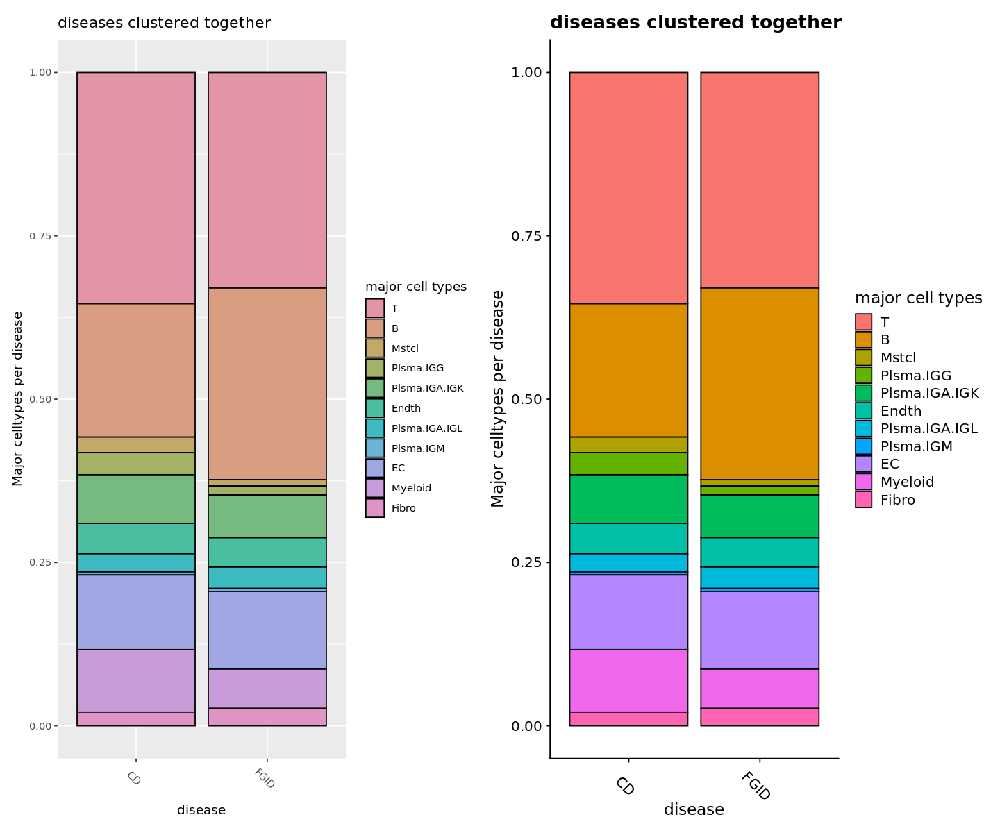

In [76]:
options(repr.plot.width=12, repr.plot.height=10)
n=typeCounts$combinedmajortype %>% unique %>% length
cbp1 <- c(rainbow_hcl(n),"#FFFFFF")
t1 <- ggplot(typeCounts,aes(fill=combinedmajortype,x=disease,y=n)) + 
       geom_bar(position='fill',stat='identity',colour="black") +
        scale_fill_manual(values=cbp1) + 
        ylab("Major celltypes per disease") + 
        theme(axis.text.x=element_text(angle=315))+
        ggtitle('diseases clustered together') +
        guides(fill=guide_legend(title="major cell types"))

t2 <- ggplot(typeCounts,aes(fill=combinedmajortype,x=disease,y=n)) + 
       geom_bar(position='fill',stat='identity',colour="black") +
        theme_cowplot() + 
        ylab("Major celltypes per disease") + 
        theme(axis.text.x=element_text(angle=315))+
        ggtitle('diseases clustered together') +
        guides(fill=guide_legend(title="major cell types"))



t1 + t2

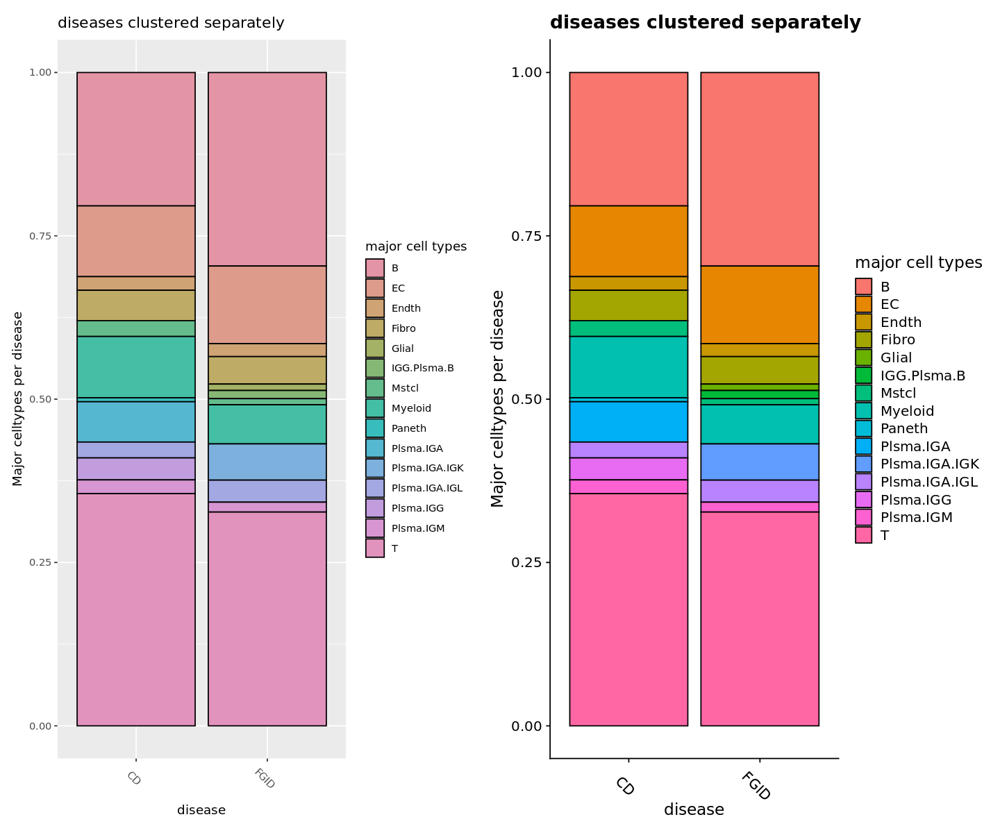

In [75]:
options(repr.plot.width=12, repr.plot.height=10)
n=septypeCounts$celltypes %>% unique %>% length
cbp1 <- c(rainbow_hcl(n),"#FFFFFF")
s1 <- ggplot(septypeCounts,aes(fill=celltypes,x=disease,y=n)) + 
       geom_bar(position='fill',stat='identity',colour="black") +
        scale_fill_manual(values=cbp1) + 
        ylab("Major celltypes per disease") + 
        theme(axis.text.x=element_text(angle=315))+
        ggtitle('diseases clustered separately') +
        guides(fill=guide_legend(title="major cell types"))

s2 <- ggplot(septypeCounts,aes(fill=celltypes,x=disease,y=n)) + 
       geom_bar(position='fill',stat='identity',colour="black") +
        theme_cowplot() + 
        ylab("Major celltypes per disease") + 
        theme(axis.text.x=element_text(angle=315))+
        ggtitle('diseases clustered separately') +
        guides(fill=guide_legend(title="major cell types"))

s1 + s2

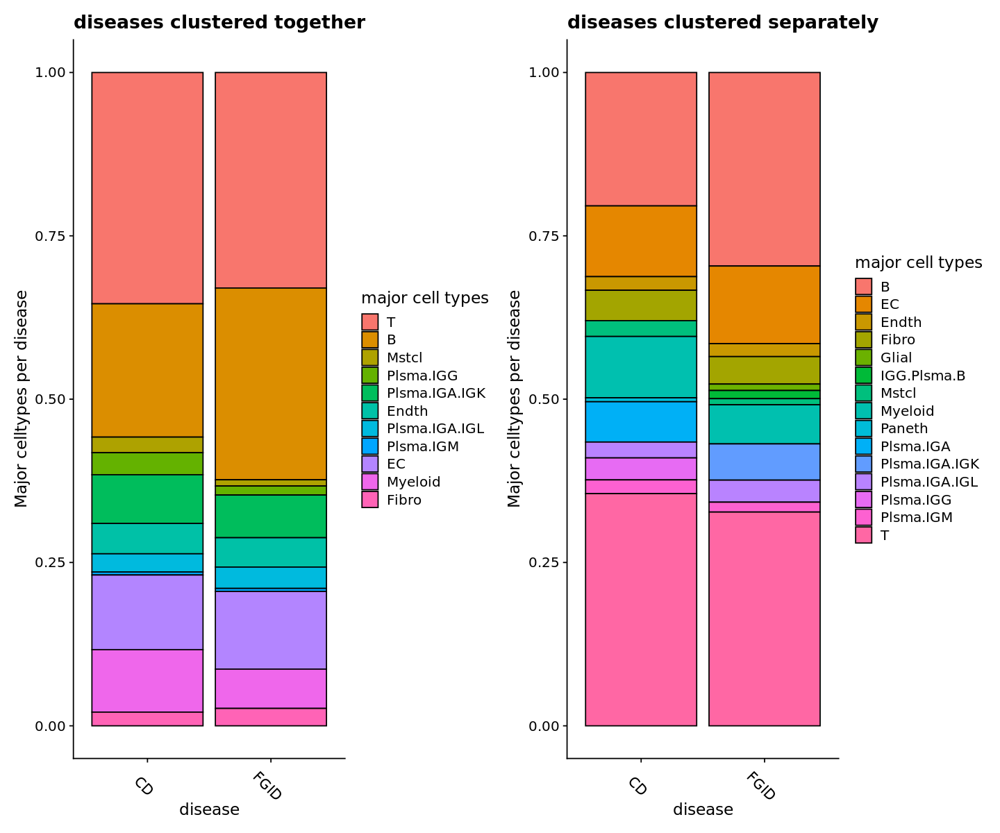

In [77]:
t2+s2

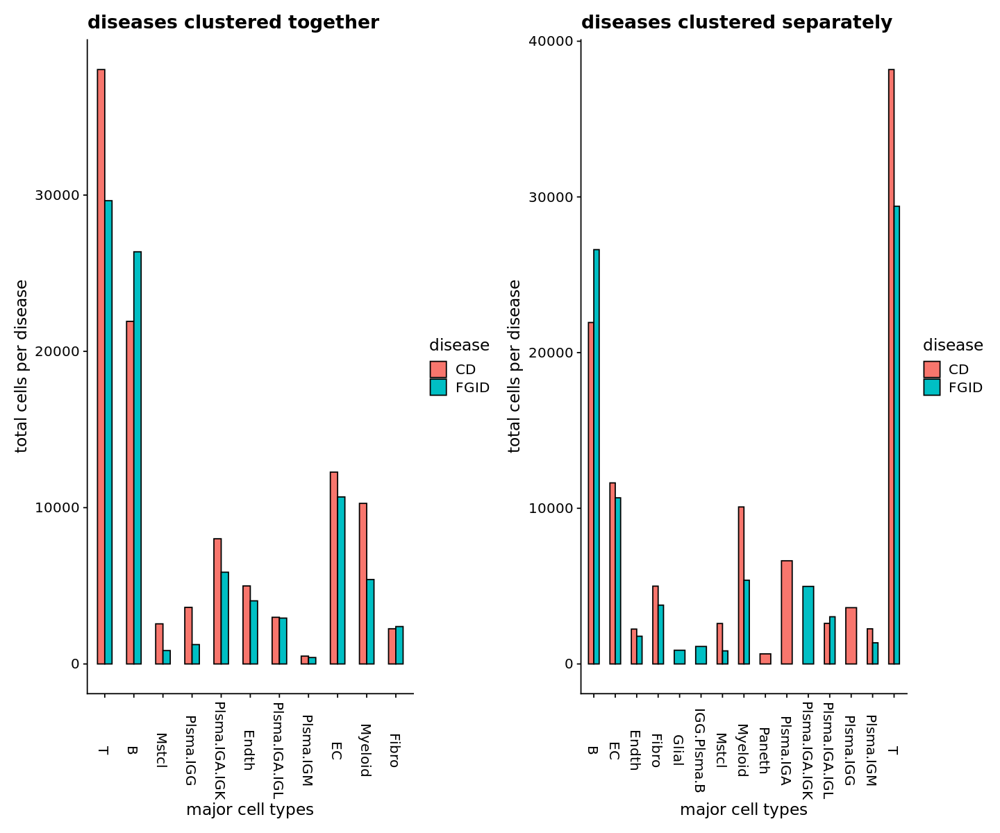

In [78]:
t3 <- ggplot(typeCounts,aes(fill=disease,x=combinedmajortype,y=n)) +
        geom_bar(stat="identity", width=.5, position = "dodge",colour='black') +
        theme_cowplot() + 
        ylab("total cells per disease") + 
        theme(axis.text.x=element_text(angle=270,vjust=0.6))+
        ggtitle('diseases clustered together') +
        labs(x="major cell types")
t4 <- ggplot(septypeCounts,aes(fill=disease,x=celltypes,y=n)) +
        geom_bar(stat="identity", width=.5, position = "dodge",colour='black') +
        theme_cowplot() + 
        ylab("total cells per disease") + 
        theme(axis.text.x=element_text(angle=270,vjust=0.6))+
        ggtitle('diseases clustered separately') +
        labs(x="major cell types")

t3+t4

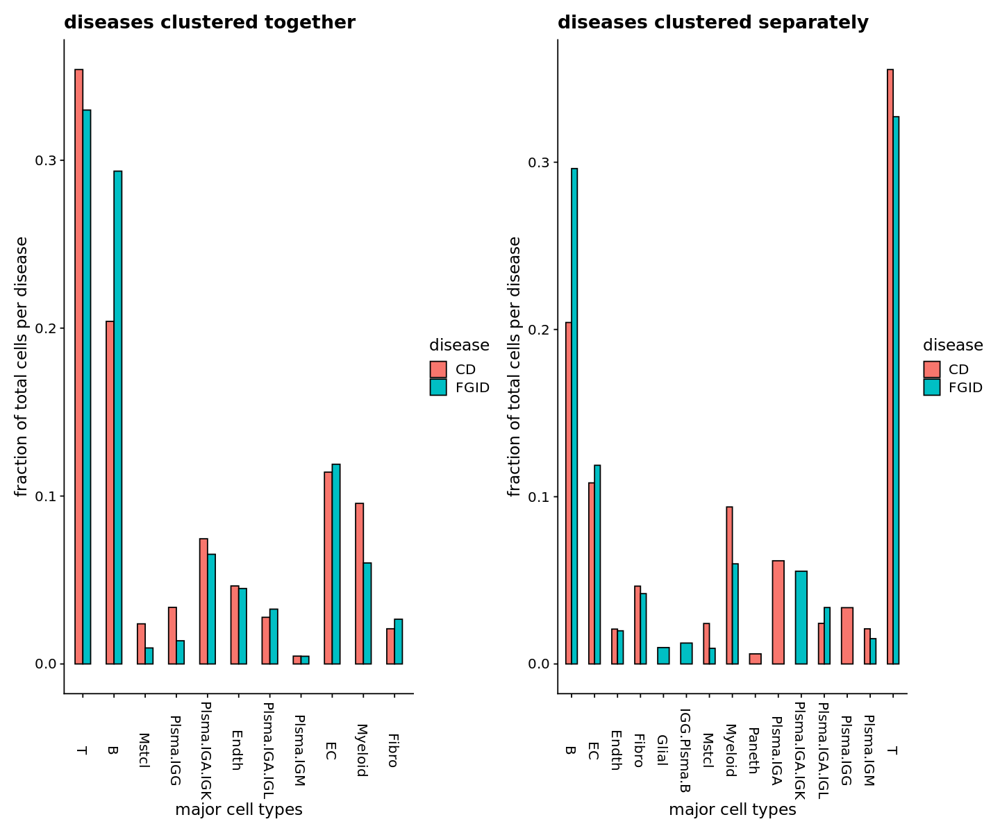

In [79]:

f1 <- ggplot(typeCounts,aes(fill=disease,x=combinedmajortype,y=norm)) +
        geom_bar(stat="identity", width=.5, position = "dodge",colour='black') +
        theme_cowplot() + 
        ylab("fraction of total cells per disease") + 
        theme(axis.text.x=element_text(angle=270,vjust=0.6))+
        ggtitle('diseases clustered together') +
        labs(x="major cell types")
t4 <- ggplot(septypeCounts,aes(fill=disease,x=celltypes,y=norm)) +
        geom_bar(stat="identity", width=.5, position = "dodge",colour='black') +
        theme_cowplot() + 
        ylab("fraction of total cells per disease") + 
        theme(axis.text.x=element_text(angle=270,vjust=0.6))+
        ggtitle('diseases clustered separately') +
        labs(x="major cell types")

t3+t4

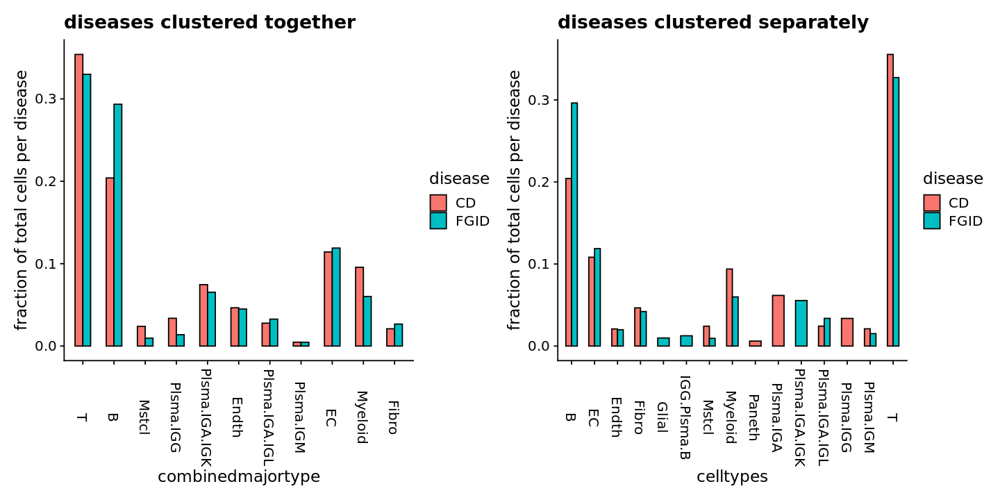

In [71]:
options(repr.plot.width=12, repr.plot.height=6)
t3+t4


In [77]:
typeCounts$SampleID %>% unique %>% length

[1] 27

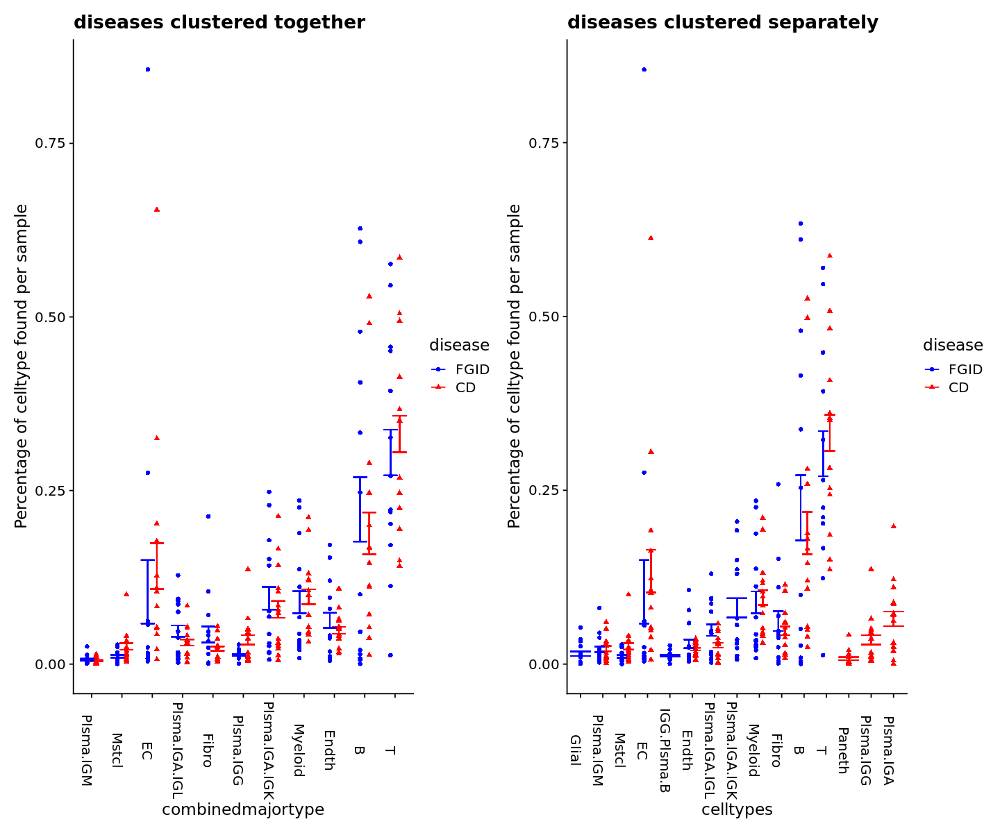

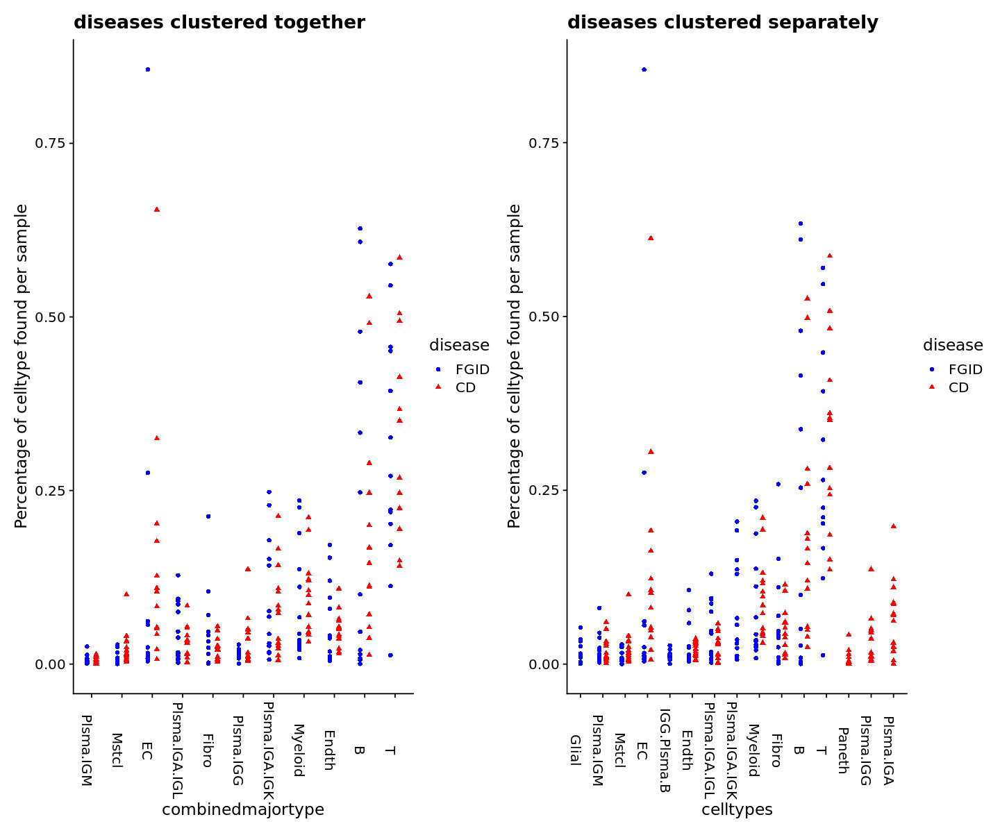

In [20]:
options(repr.plot.width=12, repr.plot.height=10)

typeCounts$disease <- factor(typeCounts$disease)
septypeCounts$disease <- factor(septypeCounts$disease)

sc1 <- ggplot(typeCounts %>% mutate(combinedmajortype = fct_reorder(combinedmajortype,percent,.fun='median')) %>%
              mutate(disease = fct_relevel(disease,'FGID','CD')),
              aes(x=combinedmajortype,colour=disease,y=percent,group=disease)) + 
       geom_point(aes(shape=disease),position=position_dodge(width=.6)) +
        scale_color_manual(values=c(CD="#FF0000",FGID="#0000FF")) +
       geom_errorbar(aes(x=combinedmajortype, ymax=mean+(sd/sqrt(27)), ymin=mean-(sd/sqrt(27))), na.rm=TRUE, position=position_dodge(width=.6)) +
        theme_cowplot() + 
        ylab("Percentage of celltype found per sample") + 
        theme(axis.text.x=element_text(angle=270))+
        ggtitle('diseases clustered together') +
        guides(fill=guide_legend(title="major cell types"))

sc2 <- ggplot(septypeCounts %>% mutate(celltypes = fct_reorder(celltypes,percent,.fun='median')) %>%
              mutate(disease = fct_relevel(disease,'FGID','CD')),
              aes(x=celltypes,colour=disease,y=percent,group=disease)) + 
       geom_point(aes(shape=disease),position=position_dodge(width=.6)) +
        scale_color_manual(values=c(CD="#FF0000",FGID="#0000FF")) +
        geom_errorbar(aes(x=celltypes, ymax=mean+(sd/sqrt(27)), ymin=mean-(sd/sqrt(27))), na.rm=TRUE, position=position_dodge(width=.6)) +
        theme_cowplot() + 
        ylab("Percentage of celltype found per sample") + 
        theme(axis.text.x=element_text(angle=270))+
        ggtitle('diseases clustered separately') +
        guides(fill=guide_legend(title="major cell types"))
sc1 + sc2

sc3 <- ggplot(typeCounts %>% mutate(combinedmajortype = fct_reorder(combinedmajortype,percent,.fun='median')) %>%
              mutate(disease = fct_relevel(disease,'FGID','CD')),
              aes(x=combinedmajortype,colour=disease,y=percent,group=disease)) + 
       geom_point(aes(shape=disease),position=position_dodge(width=.6)) +
        scale_color_manual(values=c(CD="#FF0000",FGID="#0000FF")) +
     #  geom_errorbar(aes(x=combinedmajortype, ymax=mean+(sd/sqrt(27)), ymin=mean-(sd/sqrt(27))), na.rm=TRUE, position=position_dodge(width=.6)) +
        theme_cowplot() + 
        ylab("Percentage of celltype found per sample") + 
        theme(axis.text.x=element_text(angle=270))+
        ggtitle('diseases clustered together') +
        guides(fill=guide_legend(title="major cell types"))

sc4 <- ggplot(septypeCounts %>% mutate(celltypes = fct_reorder(celltypes,percent,.fun='median')) %>%
              mutate(disease = fct_relevel(disease,'FGID','CD')),
              aes(x=celltypes,colour=disease,y=percent,group=disease)) + 
       geom_point(aes(shape=disease),position=position_dodge(width=.6)) +
        scale_color_manual(values=c(CD="#FF0000",FGID="#0000FF")) +
     #   geom_errorbar(aes(x=celltypes, ymax=mean+(sd/sqrt(27)), ymin=mean-(sd/sqrt(27))), na.rm=TRUE, position=position_dodge(width=.6)) +
        theme_cowplot() + 
        ylab("Percentage of celltype found per sample") + 
        theme(axis.text.x=element_text(angle=270))+
        ggtitle('diseases clustered separately') +
        guides(fill=guide_legend(title="major cell types"))

sc3 + sc4

The default behaviour of split.by has changed.
Separate violin plots are now plotted side-by-side.
To restore the old behaviour of a single split violin,
set split.plot = TRUE.
      
This message will be shown once per session.



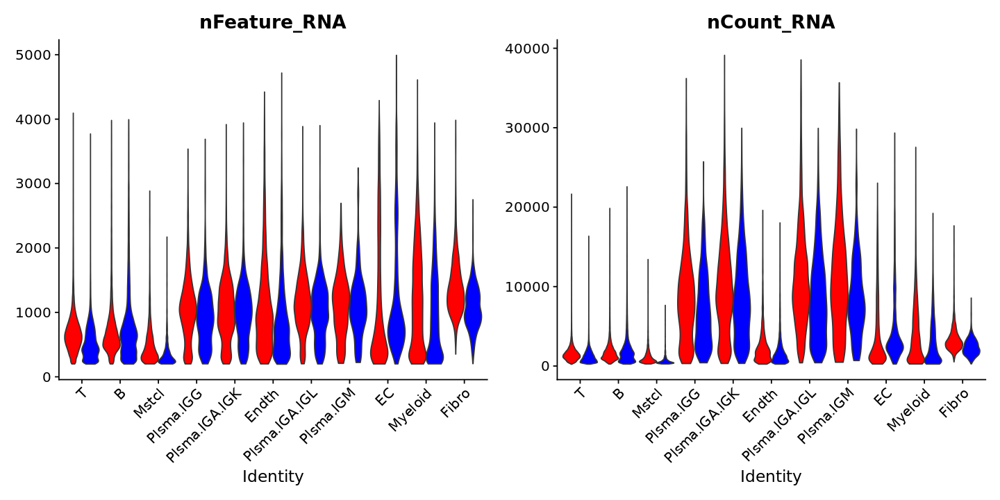

In [21]:
library(cowplot)
options(repr.plot.width=12, repr.plot.height=6)

#VlnPlot(srobj,features=c('nFeature_RNA','nCount_RNA'),group.by=srobj@meta.data$combinedMajorTypes)
v1 <- VlnPlot(srobj,features=c('nFeature_RNA','nCount_RNA'),group.by=srobj@meta.data$combinedMajorTypes,split.by='disease',pt.size=0,
       cols = c('#FF0000','#0000FF'))
#v2 <- VlnPlot(srobj,features=c('nCount_RNA'),group.by=srobj@meta.data$combinedMajorTypes,split.by='disease',pt.size=0,
#       cols = c('#FF0000','#0000FF'))

v1
#scale_color_manual(values=c(CD="#FF0000",FGID="#0000FF")) 
#VlnPlot(srobj,features=c('nCount_RNA'),group.by=srobj@meta.data$combinedMajorTypes)
#sc.pl.violin(adata, 'nFeature_RNA', groupby='test', size=2,log=True,cut=0,rotation=90,save="_nCount_UMI_per_Combined_Major_Type.pdf") 

In [22]:
GeomSplitViolin <- ggproto("GeomSplitViolin", GeomViolin, 
                           draw_group = function(self, data, ..., draw_quantiles = NULL) {
  data <- transform(data, xminv = x - 1.25*violinwidth * (x - xmin), xmaxv = x + 1.25*violinwidth * (xmax - x))
  grp <- data[1, "group"]
  newdata <- plyr::arrange(transform(data, x = if (grp %% 2 == 1) xminv else xmaxv), if (grp %% 2 == 1) y else -y)
  newdata <- rbind(newdata[1, ], newdata, newdata[nrow(newdata), ], newdata[1, ])
  newdata[c(1, nrow(newdata) - 1, nrow(newdata)), "x"] <- round(newdata[1, "x"])

  if (length(draw_quantiles) > 0 & !scales::zero_range(range(data$y))) {
    stopifnot(all(draw_quantiles >= 0), all(draw_quantiles <=
      1))
    quantiles <- ggplot2:::create_quantile_segment_frame(data, draw_quantiles)
    aesthetics <- data[rep(1, nrow(quantiles)), setdiff(names(data), c("x", "y")), drop = FALSE]
    aesthetics$alpha <- rep(1, nrow(quantiles))
    both <- cbind(quantiles, aesthetics)
    quantile_grob <- GeomPath$draw_panel(both, ...)
    ggplot2:::ggname("geom_split_violin", grid::grobTree(GeomPolygon$draw_panel(newdata, ...), quantile_grob))
  }
  else {
    ggplot2:::ggname("geom_split_violin", GeomPolygon$draw_panel(newdata, ...))
  }
})

geom_split_violin <- function(mapping = NULL, data = NULL, stat = "ydensity", position = "identity", ..., 
                              draw_quantiles = NULL, trim = TRUE, scale = "area", na.rm = FALSE, 
                              show.legend = NA, inherit.aes = TRUE) {
  layer(data = data, mapping = mapping, stat = stat, geom = GeomSplitViolin, 
        position = position, show.legend = show.legend, inherit.aes = inherit.aes, 
        params = list(trim = trim, scale = scale, draw_quantiles = draw_quantiles, na.rm = na.rm, ...))
}

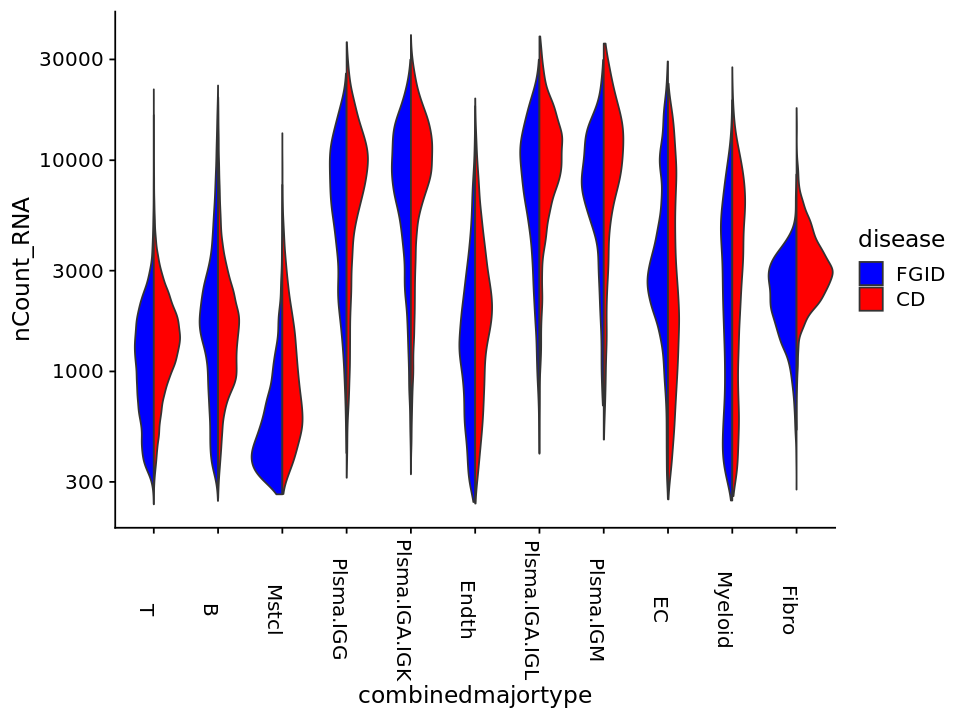

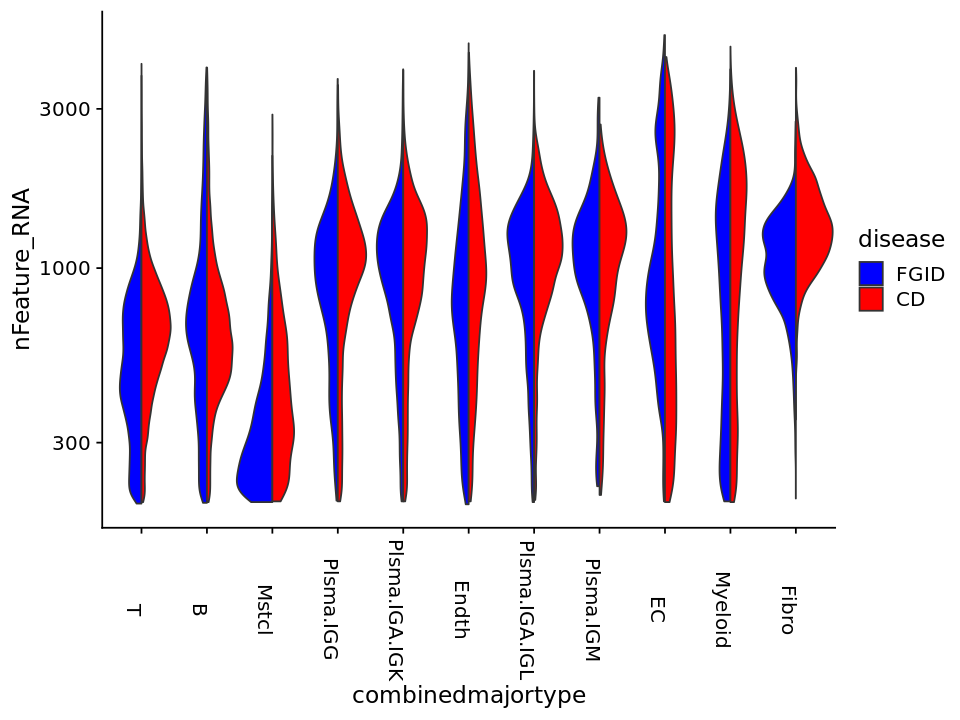

In [23]:
options(repr.plot.width=8, repr.plot.height=6)


sv1 <- ggplot( data=srobj@meta.data %>% mutate(disease = fct_relevel(disease,'FGID','CD')), 
       aes(x=combinedmajortype, y=nCount_RNA, fill = disease) ) + 
    geom_split_violin() +
    scale_y_continuous(trans='log10') + 
    scale_fill_manual(values=c('#0000FF','#FF0000')) + 
    theme_cowplot() +
    theme(axis.text.x=element_text(angle=270))

sv2 <- ggplot(data=srobj@meta.data %>% mutate(disease = fct_relevel(disease,'FGID','CD')), 
        aes(x=combinedmajortype, y=nFeature_RNA, fill = disease) ) + 
    geom_split_violin() +
    scale_y_continuous(trans='log10') + 
    scale_fill_manual(values=c('#0000FF','#FF0000')) + 
    theme_cowplot() +
    theme(axis.text.x=element_text(angle=270))

sv1
sv2
#head(srobj@meta.data$combinedmajortype)

In [24]:
OUTDIR='QCfigs'
#dir.create('QCfigs')
list.dirs()

[1] "."                    "./.ipynb_checkpoints" "./figures"           
[4] "./QCfigs"

In [25]:


#ggsave(plot=t3+t4, 
#       file=file.path(OUTDIR, "dodgeBar_fraction_majortypes_unified_separate.pdf"), 
#       useDingbats=FALSE,
#       height=6, width=12)
#ggsave(plot=t2+s2,
#       file=file.path(OUTDIR, "stackedBar_fraction_majortypes_unified_separate.pdf"), 
#       useDingbats=FALSE,
#       height=6, width=12)   


#ggsave(plot=sc2,
#       file=file.path(OUTDIR, "SamplePoints_fraction_SEMbars_majortypes_separate.pdf"), 
#       useDingbats=FALSE,
#       height=6, width=6)

ggsave(plot=sc1,
       file=file.path(OUTDIR, "SamplePoints_fraction_SEMbars_majortypes_unified.pdf"), 
       useDingbats=FALSE,
       height=6, width=6)

#ggsave(plot=sc1+sc2,
#       file=file.path(OUTDIR, "SamplePoints_fraction_majortypes_unified_separate.pdf"), 
#       useDingbats=FALSE,
#       height=6, width=12)

#ggsave(plot=sc3+sc4,
#       file=file.path(OUTDIR, "SamplePoints_fraction_majortypes_unified_separate.pdf"), 
#       useDingbats=FALSE,
#       height=6, width=12)

ggsave(plot=sv1,
      file=file.path(OUTDIR, "DualViolin_diseases_nCountRNA_majortypes_unified.pdf"), 
       useDingbats=FALSE,
       height=6, width=8)

ggsave(plot=sv2,
      file=file.path(OUTDIR, "DualViolin_diseases_nFeatureRNA_majortypes_unified.pdf"), 
       useDingbats=FALSE,
       height=6, width=8)



system(sprintf('gsutil rsync %s %s/CD14_FGID_combined',OUTDIR, Sys.getenv("PREDICT_BUCKET")),intern=T)

character(0)

In [44]:
OUTDIR='UMAPfigs'
dir.create('UMAPfigs')
list.dirs()


[1] "."                    "./.ipynb_checkpoints" "./DEfigs"            
[4] "./UMAPfigs"

In [76]:
ggsave(plot=d1+d2, 
       file=file.path(OUTDIR, "UMAP_majortypes_unified_separate_2.pdf"), 
       useDingbats=FALSE,
       height=6, width=12)

ggsave(plot=d3,
       file=file.path(OUTDIR, "UMAP_diseases_2.pdf"), 
       useDingbats=FALSE,
       height=6, width=6)



#ggsave(plot=d3+d4, 
#       file=file.path(OUTDIR, "tsne_majortypes_unified_separate.pdf"), 
#       useDingbats=FALSE,
#       height=6, width=12)

system(sprintf('gsutil rsync %s %s/CD14_FGID_combined', OUTDIR, Sys.getenv("PREDICT_BUCKET")),intern=T)

ERROR: Error in .C("scattermore", n = as.integer(n), ncol = as.integer(ncol), : "scattermore" not resolved from current namespace (scattermore)


In [ ]:
###Next up, DE between FGID + CD

In [25]:
Idents(srobj) <- srobj@meta.data$combinedmajortype

SplitSrobjOnMeta <- function(srobj, meta) {
  metacol <- grep(meta,colnames(srobj@meta.data))
    lapply(unique(srobj@meta.data[,metacol]),
         function(x) {tmp <- subset(srobj, cells= (srobj@meta.data %>% 
                          filter(srobj@meta.data[,metacol]==x) %>% pull(CellID))); 
         tmp@meta.data <- srobj@meta.data %>% filter(srobj@meta.data[,metacol] == x)
         return(tmp)})
}

typeobjs <- SplitSrobjOnMeta(srobj,meta='combinedmajortype')

typeobjs


[[1]]
An object of class Seurat 
46176 features across 67671 samples within 2 assays 
Active assay: SCT (22431 features, 3000 variable features)
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

[[2]]
An object of class Seurat 
46176 features across 5920 samples within 2 assays 
Active assay: SCT (22431 features, 3000 variable features)
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

[[3]]
An object of class Seurat 
46176 features across 13880 samples within 2 assays 
Active assay: SCT (22431 features, 3000 variable features)
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

[[4]]
An object of class Seurat 
46176 features across 3425 samples within 2 assays 
Active assay: SCT (22431 features, 3000 variable features)
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

[[5]]
An object of class Seurat 
46176 features across 22960 samples within 2 assays 
Active assay: SCT (22431 fea

In [26]:
markers <- data.frame()
markers

<0 x 0 matrix>

In [77]:
#bimodmarkers <- data.frame()
wilmarkers <- data.frame()
#bimodmarkers <- lapply(typeobjs,function(x) {Idents(x) <- x@meta.data$disease; markerstmp <- FindAllMarkers(x,test.use='bimod'); markerstmp$celltype <- x@meta.data$combinedmajortype %>% unique; markers <- markers %>% bind_rows(markerstmp);return(markers)})
#wilmarkers <- lapply(typeobjs,function(x) {Idents(x) <- x@meta.data$disease; markerstmp <- FindAllMarkers(x,only.pos=TRUE); markerstmp$celltype <- x@meta.data$combinedmajortype %>% unique; markers <- markers %>% bind_rows(markerstmp); return(markers)})
wilmarkers <- lapply(typeobjs,function(x) {Idents(x) <- x@meta.data$disease; markerstmp <- FindAllMarkers(x,logfc.threshold =0.1,only.pos=TRUE); markerstmp$celltype <- x@meta.data$combinedmajortype %>% unique; markers <- markers %>% bind_rows(markerstmp); return(markers)})

Calculating cluster CD

Calculating cluster FGID

Calculating cluster CD

Calculating cluster FGID

Calculating cluster CD

Calculating cluster FGID

Calculating cluster CD

Calculating cluster FGID

Calculating cluster CD

Calculating cluster FGID

Calculating cluster CD

Calculating cluster FGID

Calculating cluster CD

Calculating cluster FGID

Calculating cluster CD

Calculating cluster FGID

Calculating cluster CD

Calculating cluster FGID

Calculating cluster CD

Calculating cluster FGID

Calculating cluster CD

Calculating cluster FGID



In [205]:
wilcox <- bind_rows(wilmarkers, .id = "id")

In [79]:
#This is an extra layer of stringency - FoldChange > 1.5
#wilcfilt <- wilcox %>% filter(avg_log2FC > 0.58, p_val_adj < 0.001) %>% group_by(celltype)

wilcfilt <- wilcox %>% filter(avg_log2FC > 0, avg_log2FC > 0.25) %>% group_by(celltype)

In [206]:
#with only.pos=TRUE
wilcox %>% dim
wilcox %>% head

[1] 4108    9

,id,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene,celltype
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>,<fct>
IGKC...1,1,0,0.5800015,0.852,0.809,0,CD,IGKC,T
S100A4...2,1,0,0.4944539,0.496,0.349,0,CD,S100A4,T
B2M...3,1,0,0.4603114,1.000,1.000,0,CD,B2M,T
IL32...4,1,0,0.4267069,0.723,0.570,0,CD,IL32,T
HLA-B...5,1,0,0.3825567,0.978,0.963,0,CD,HLA-B,T
ISG15...6,1,0,0.3327687,0.315,0.176,0,CD,ISG15,T


In [81]:
#without only.pos=TRUE
wilcfilt %>% dim
wilcfilt %>% head

[1] 1016    9

id,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene,celltype
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>,<fct>
1,0,0.5800015,0.852,0.809,0,CD,IGKC,T
1,0,0.4944539,0.496,0.349,0,CD,S100A4,T
1,0,0.4603114,1.000,1.000,0,CD,B2M,T
1,0,0.4267069,0.723,0.570,0,CD,IL32,T
1,0,0.3825567,0.978,0.963,0,CD,HLA-B,T
1,0,0.3327687,0.315,0.176,0,CD,ISG15,T


In [82]:
wilcoxCounts <- wilcox %>% group_by(celltype) %>% filter(p_val_adj < 0.001,avg_log2FC>0.25) %>%
                    #summarise(n=n_distinct(gene))
                     count(cluster)

wilcoxCounts[wilcoxCounts$cluster=='FGID',]$n = -wilcoxCounts[wilcoxCounts$cluster=='FGID',]$n
wilcoxCounts

celltype,cluster,n
<fct>,<fct>,<int>
T,CD,22
T,FGID,-2
B,CD,19
B,FGID,-26
Mstcl,CD,38
Mstcl,FGID,-3
Plsma.IGG,CD,24
Plsma.IGG,FGID,-24
Plsma.IGA.IGK,CD,23


In [83]:
sb1 <- ggplot(wilcoxCounts %>% group_by(celltype) %>%
              mutate(cluster = fct_relevel(cluster,'FGID','CD')),
              aes(x=celltype,fill=cluster,y=n,group=cluster)) + 
        geom_col() +
        scale_fill_manual(values=c(CD="#FF0000",FGID="#0000FF")) +
        theme_cowplot() + 
        scale_y_continuous(limits=c(-210,210)) +
        coord_flip() +
        ylab("") + 
        theme(axis.text.x=element_text(angle=270))+
        ggtitle('Combined Clustering:\nlogFC > 0.25, FDR<0.001 by celltype') +
        guides(fill=guide_legend(title="condition"))

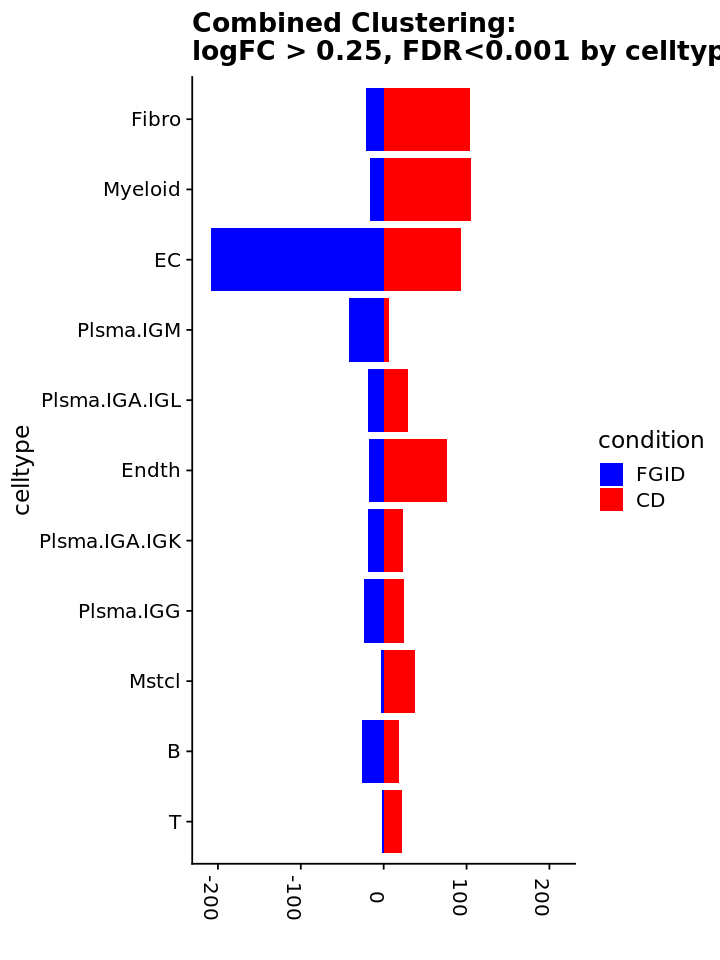

In [55]:
sb1

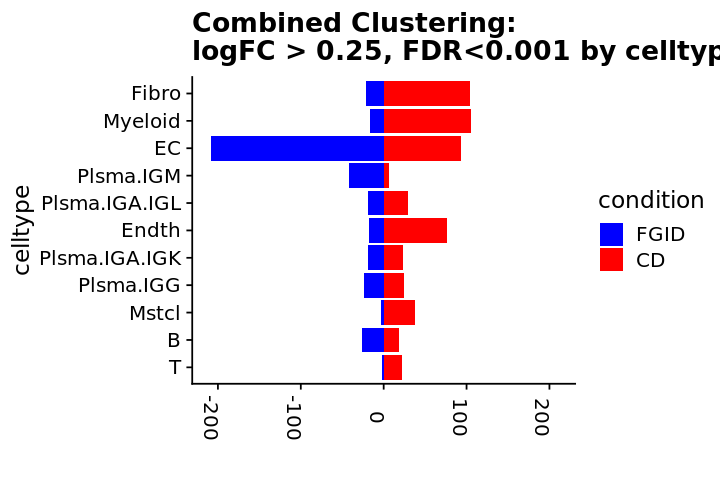

In [56]:
options(repr.plot.width=6, repr.plot.height=4)
sb1

In [36]:
OUTDIR='UMAPfigs'
dir.create('UMAPfigs')
list.dirs()
ggsave(plot=sb1,
       file=file.path(OUTDIR, "sideBar_diseases_majortypes_2.pdf"), 
       useDingbats=FALSE,
       height=5, width=6)
system(sprintf('gsutil rsync %s %s/CD14_FGID_combined',OUTDIR, Sys.getenv("PREDICT_BUCKET"),),intern=T)

Warning message in dir.create("UMAPfigs"):
“'UMAPfigs' already exists”


[1] "."                    "./.ipynb_checkpoints" "./DEfigs"            
[4] "./UMAPfigs"

character(0)

Warning message:
“Removed 6 rows containing missing values (geom_point).”
Warning message:
“Removed 6 rows containing missing values (geom_label_repel).”
Warning message:
“ggrepel: 74 unlabeled data points (too many overlaps). Consider increasing max.overlaps”
Warning message:
“ggrepel: 21 unlabeled data points (too many overlaps). Consider increasing max.overlaps”
Warning message:
“ggrepel: 18 unlabeled data points (too many overlaps). Consider increasing max.overlaps”
Warning message:
“ggrepel: 2 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


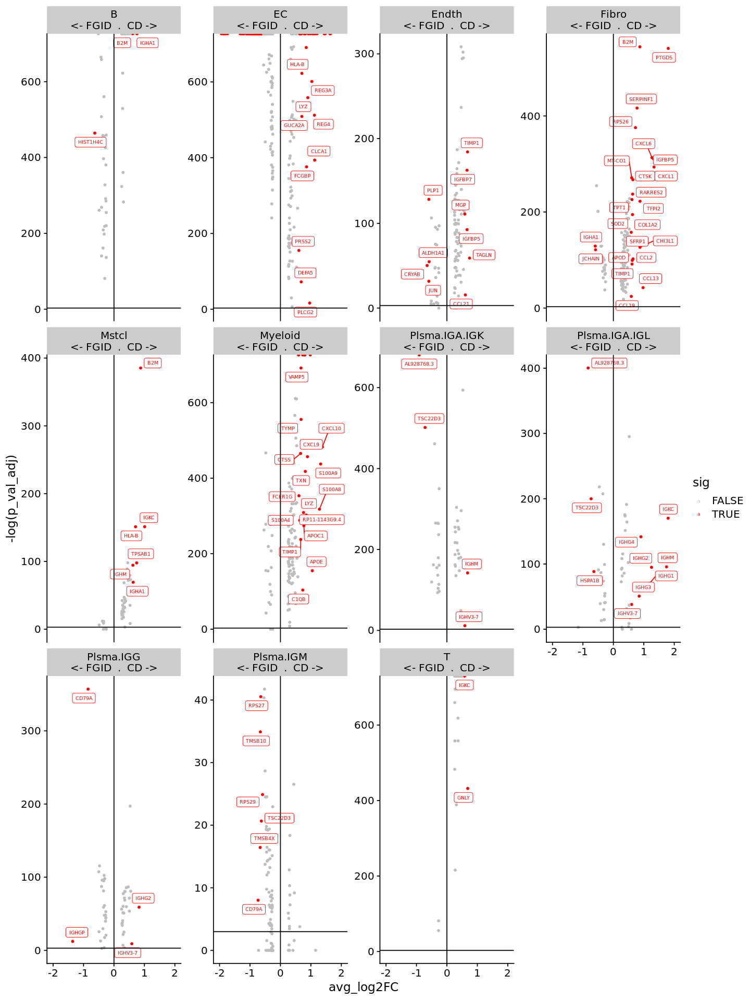

In [43]:
library(ggrepel)
options(repr.plot.width=12, repr.plot.height=16)

wilcfilt <- wilcox %>% group_by(celltype) %>% mutate(sig = ifelse(abs(avg_log2FC) > 0.34 & 
                                                                 p_val_adj <0.001,
#                                                                 pct.1 > 0.2 &
#                                                                 pct.2 > 0.2, 
                                                                 TRUE, FALSE))

wilcfilt[wilcfilt$cluster=='FGID',]$avg_log2FC = -wilcfilt[wilcfilt$cluster=='FGID',]$avg_log2FC

options(repr.plot.width=12, repr.plot.height=16)

wilcfilt$ann <- paste0(wilcfilt$celltype,'\n<- FGID  .  CD ->')

ggplot(wilcfilt %>%
              mutate(assay = fct_relevel(cluster,'FGID','CD'))) +
    geom_point(aes(y=-log(p_val_adj), x=avg_log2FC,color=sig),size=1) +
    ggrepel::geom_label_repel(data=wilcfilt %>% filter(sig==TRUE),aes(y=-log(p_val_adj),
                   x=avg_log2FC,
                    color=sig,
                   label=gene),
               size=2) +
    facet_wrap(.~ann, scales="free_y") +
    scale_color_manual(values=c("grey", "red")) +
    geom_vline(xintercept = 0) +
    geom_hline(yintercept = -log(0.05)) +
    xlim(c(-2, 2)) +
    cowplot::theme_cowplot()

In [232]:
library(cluster)
library(grid)

custom_palette <- RColorBrewer::brewer.pal(8, "Dark2")[c(4,5,6,3,8)]
custom_lattice <- custom.lattice()
custom_lattice$superpose.polygon$col = custom_palette
custom_lattice$superpose.symbol$col = custom_palette
custom_lattice$superpose.line$col = custom_palette
custom_lattice$axis.line = list(col = 0)
custom_lattice$strip.border = list(col=0)
#list(cex=2, lines=1.5)
#xyplot(a~b|c, data=dat,
#       par.strip.text = stripParams,
#       par.settings = list(strip.background=list(col="gray")))

In [220]:
custom_lattice$

[1] "#E7298A"

In [170]:
brewer.pal(8, "Dark2")[c(4,5,6,3,8)]

[1] "#E7298A" "#66A61E" "#E6AB02" "#7570B3" "#666666"

Warning message in x <= v:
“longer object length is not a multiple of shorter object length”
Warning message in x > v:
“longer object length is not a multiple of shorter object length”
Warning message in x > v:
“longer object length is not a multiple of shorter object length”
Warning message in x <= v:
“longer object length is not a multiple of shorter object length”
Warning message in x <= v:
“longer object length is not a multiple of shorter object length”
Warning message in x > v:
“longer object length is not a multiple of shorter object length”
Warning message in x > v:
“longer object length is not a multiple of shorter object length”
Warning message in x <= v:
“longer object length is not a multiple of shorter object length”
Warning message in x <= v:
“longer object length is not a multiple of shorter object length”
Warning message in x > v:
“longer object length is not a multiple of shorter object length”
Warning message in x > v:
“longer object length is not a multiple of shorte

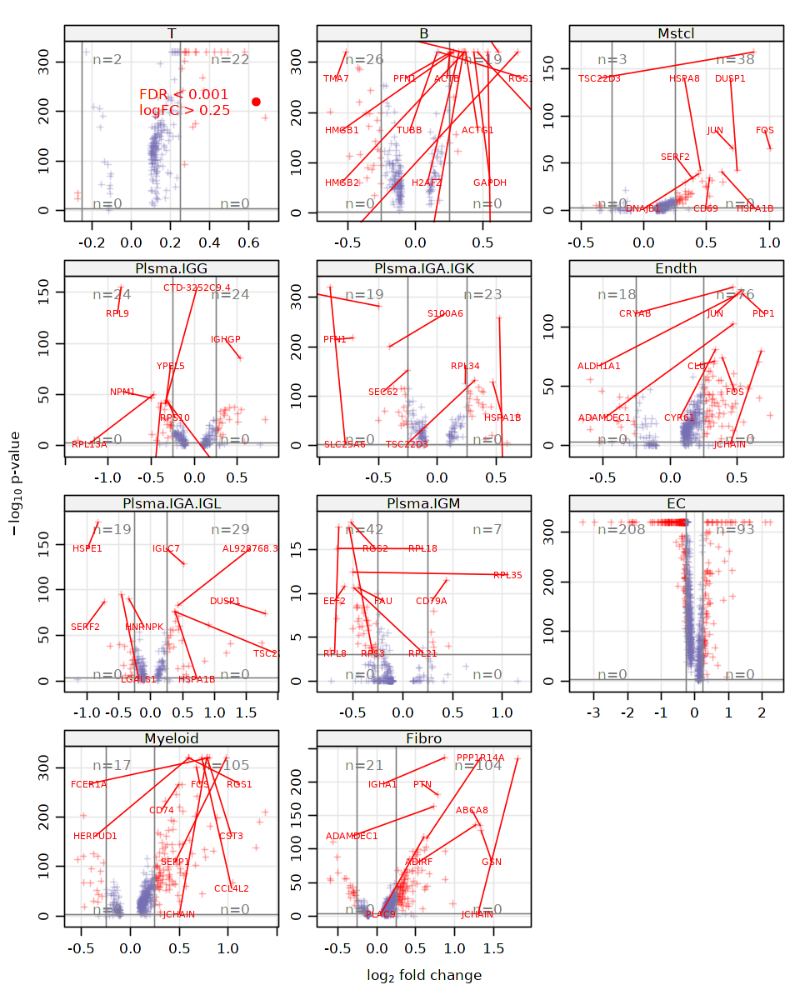

In [216]:
wilcfilt <- wilcox %>% group_by(celltype) %>% mutate(sig = ifelse(abs(avg_log2FC) > 0.25 & 
                                                                 p_val_adj <0.001,
#                                                                 pct.1 > 0.2 &
#                                                                 pct.2 > 0.2, 
                                                                 TRUE, FALSE),
                                                    selected=ifelse(rank(avg_log2FC) < 10, TRUE,FALSE))

wilcfilt[wilcfilt$cluster=='FGID',]$avg_log2FC = -wilcfilt[wilcfilt$cluster=='FGID',]$avg_log2FC
options(repr.plot.width=8, repr.plot.height=10)
#wilcfilt$ann <- paste0(wilcfilt$celltype,'\n<- FGID  .  CD ->')


# volcanoplot with potential boundaries for enriched genes
xy_v1 <- wilcfilt %>% mutate(sig = fct_relevel(as.factor(sig),'TRUE','FALSE')) %>% 
  filter(!is.na(avg_log2FC), !is.na(p_val_adj)) %>%
  
  xyplot(-log10(p_val_adj+(1*10^-320)) ~ avg_log2FC | 
      celltype, .,#%>% factor(., unique(.)[c(2,3,1,4)]),  
    as.table = TRUE, groups = sig, layout = c(3, 4),
    par.settings = custom.lattice, 
    xlab = bquote(log[2] ~ "fold change"), ylab = bquote(-log[10] ~ "p-value"),
    col = c("#FF0000","#7570B3"),
    cex = 0.5, pch = 3, between = list(x = 0.25, y = 0.25),
    scales = "free",#list(alternating = FALSE),
    #xlim = c(-2, 2), #ylim = c(0, 450), 
    panel = function(x, y, groups, subscripts, col=c('#FF0000'),...) {
      panel.grid(h = -1, v = -1, col = grey(0.9))
      panel.xyplot(x, y, groups = groups, subscripts = subscripts, col=c('#FF0000','#7570B3'),alpha = 0.3, ...)
      # only quadrants for induced genes
      panel.quadrants(x[groups[subscripts] == 'TRUE'], y[groups[subscripts] == 'TRUE'], 
        h = 3, v = c(-.25,.25), labels = "events")
      panel.key(c("FDR < 0.001\nlogFC > 0.25"), col = c("#FF0000"), 
        pch = 19, corner = c(0.9, 0.7))
      panel.directlabel(x, y,  
      labels=wilcfilt %>% filter(avg_log2FC %in% x) %>% arrange(avg_log2FC) %>% pull(gene),
      selected=ifelse(rank(-log10(y)) < 10, TRUE,FALSE),
#      cex= .2,
      col = c("#FF0000"),
#        method='extreme.grid',
      box_fill='white',
#      box_line='white',                  
#      box_line = TRUE,
        ...)
    }
  )
#yellow + grey c("#E6AB02", "#7570B3")
xy_v1

Warning message in x <= v:
“longer object length is not a multiple of shorter object length”
Warning message in x > v:
“longer object length is not a multiple of shorter object length”
Warning message in x > v:
“longer object length is not a multiple of shorter object length”
Warning message in x <= v:
“longer object length is not a multiple of shorter object length”
Warning message in x <= v:
“longer object length is not a multiple of shorter object length”
Warning message in x > v:
“longer object length is not a multiple of shorter object length”
Warning message in x > v:
“longer object length is not a multiple of shorter object length”
Warning message in x <= v:
“longer object length is not a multiple of shorter object length”
Warning message in x <= v:
“longer object length is not a multiple of shorter object length”
Warning message in x > v:
“longer object length is not a multiple of shorter object length”
Warning message in x > v:
“longer object length is not a multiple of shorte

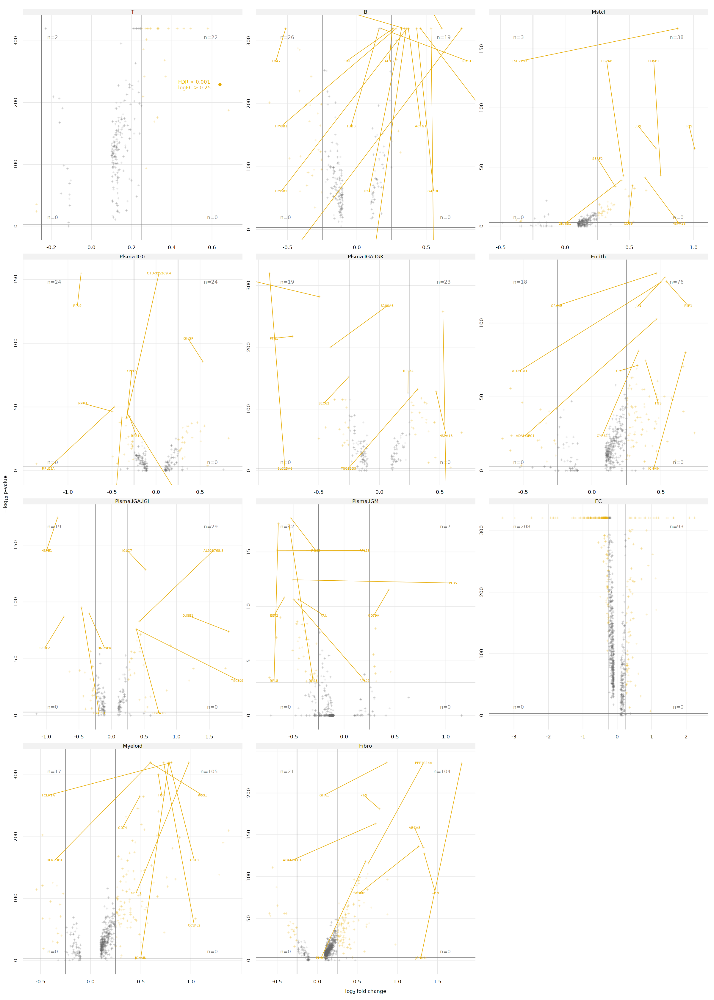

In [235]:
wilcfilt <- wilcox %>% group_by(celltype) %>% mutate(sig = ifelse(abs(avg_log2FC) > 0.25 & 
                                                                 p_val_adj <0.001,
#                                                                 pct.1 > 0.2 &
#                                                                 pct.2 > 0.2, 
                                                                 TRUE, FALSE),
                                                    selected=ifelse(rank(avg_log2FC) < 10, TRUE,FALSE))

wilcfilt[wilcfilt$cluster=='FGID',]$avg_log2FC = -wilcfilt[wilcfilt$cluster=='FGID',]$avg_log2FC
options(repr.plot.width=20, repr.plot.height=28)
#wilcfilt$ann <- paste0(wilcfilt$celltype,'\n<- FGID  .  CD ->')


# volcanoplot with boundaries for enriched genes
xy_v1 <- wilcfilt %>% mutate(sig = fct_relevel(as.factor(sig),'TRUE','FALSE')) %>% 
  filter(!is.na(avg_log2FC), !is.na(p_val_adj)) %>%
  
  xyplot(-log10(p_val_adj+(1*10^-320)) ~ avg_log2FC | 
      celltype, .,#%>% factor(., unique(.)[c(2,3,1,4)]),  
    as.table = TRUE, groups = sig, layout = c(3, 4),
    par.settings = custom_lattice, 
    xlab = bquote(log[2] ~ "fold change"), ylab = bquote(-log[10] ~ "p-value"),
    col = c("#E6AB02", "#666666"),
    cex = 0.5, pch = 3, between = list(x = 0.25, y = 0.25),
    scales = "free",#list(alternating = FALSE),
    #xlim = c(-2, 2), #ylim = c(0, 450), 
    panel = function(x, y, groups, subscripts, col=c("#E6AB02"),...) {
      panel.grid(h = -1, v = -1, col = grey(0.9))
      panel.xyplot(x, y, groups = groups, subscripts = subscripts, col=c("#E6AB02", "#666666"),alpha = 0.3, ...)
      # only quadrants for induced genes
      panel.quadrants(x[groups[subscripts] == 'TRUE'], y[groups[subscripts] == 'TRUE'], 
        h = 3, v = c(-.25,.25), labels = "events")
      panel.key(c("FDR < 0.001\nlogFC > 0.25"), col = c("#E6AB02"), 
        pch = 19, corner = c(0.9, 0.7))
      panel.directlabel(x, y,  
      labels=wilcfilt %>% filter(avg_log2FC %in% x) %>% arrange(avg_log2FC) %>% pull(gene),
      selected=ifelse(rank(-log10(y)) < 10, TRUE,FALSE),
#      cex= .2,
      col = c("#E6AB02"),
        method='extreme.grid',
        draw_line=FALSE,
#      box_fill='white',
#      box_line='white',                  
#      box_line = TRUE,
        ...)
    }
  )
#yellow + grey c("#E6AB02", "#7570B3")
#pink + darkgrey c('#E7298A','#666666')

xy_v1

In [ ]:
panel.directlabel()

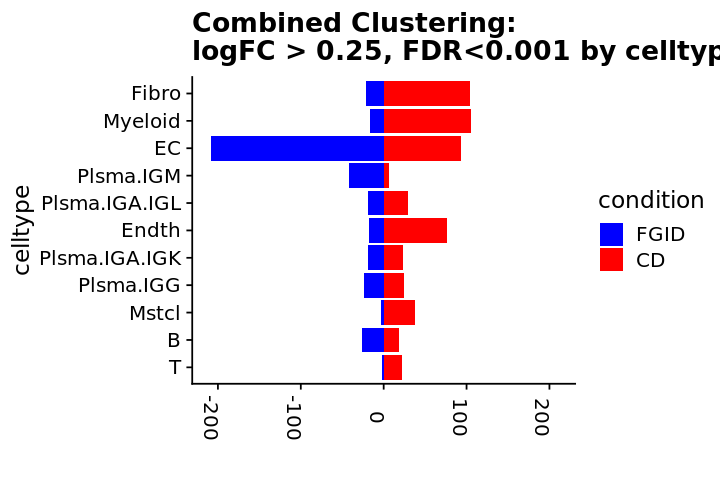

In [84]:
options(repr.plot.width=6, repr.plot.height=4)
sb1

In [141]:
install.packages('textshaping')
install.packages('ragg')
install.packages('ggrastr')
BiocManager::install('EnhancedVolcano')
library(EnhancedVolcano)


Installing package into ‘/home/jupyter-user/notebooks/packages’
(as ‘lib’ is unspecified)

Warning message in install.packages("textshaping"):
“installation of package ‘textshaping’ had non-zero exit status”
Installing package into ‘/home/jupyter-user/notebooks/packages’
(as ‘lib’ is unspecified)

also installing the dependency ‘textshaping’


Warning message in install.packages("ragg"):
“installation of package ‘textshaping’ had non-zero exit status”
Warning message in install.packages("ragg"):
“installation of package ‘ragg’ had non-zero exit status”
Installing package into ‘/home/jupyter-user/notebooks/packages’
(as ‘lib’ is unspecified)

also installing the dependencies ‘textshaping’, ‘ragg’


Warning message in install.packages("ggrastr"):
“installation of package ‘textshaping’ had non-zero exit status”
Warning message in install.packages("ggrastr"):
“installation of package ‘ragg’ had non-zero exit status”
Warning message in install.packages("ggrastr"):
“installation of package ‘

ERROR: Error in library(EnhancedVolcano): there is no package called ‘EnhancedVolcano’


In [ ]:
EnhancedVolcano(Comp1$`T Cells`, lab = rownames(Comp1$`T Cells`), x = 'avg_log2FC', y = 'p_val_adj', ylim = c(0,300),
                title = "T Cells", subtitle = "Up in WT PBS D3            Up in WT MHV D3",
                legendPosition = 'right', legendLabSize = 0.1, legendIconSize = 0,
                gridlines.major = FALSE, gridlines.minor = FALSE)

In [44]:
v1 <- ggplot(wilcfilt %>%
              mutate(assay = fct_relevel(cluster,'FGID','CD'))) +
    geom_point(aes(y=-log(p_val_adj), x=avg_log2FC,color=sig),size=1) +
    ggrepel::geom_label_repel(data=wilcfilt %>% filter(sig==TRUE),aes(y=-log(p_val_adj),
                   x=avg_log2FC,
                    color=sig,
                   label=gene),
               size=2) +
    facet_wrap(.~ann, scales="free_y") +
    scale_color_manual(values=c("grey", "red")) +
    geom_vline(xintercept = 0) +
    geom_hline(yintercept = -log(0.05)) +
    xlim(c(-2, 2)) +
    cowplot::theme_cowplot()

In [204]:
OUTDIR='DEfigs'

dir.create(OUTDIR)

ggsave(plot=sb1, 
       file=file.path(OUTDIR, "SideBar_majortypes_unified_DEgeneCounts.pdf"), 
       useDingbats=FALSE,
       height=4, width=6)

#ggsave(plot=xy_v1, 
#       file=file.path(OUTDIR, "xyvolcano_no_text_majortypes_unified_FGIDvCD.pdf"), 
#       useDingbats=FALSE,
#       height=16, width=12)

pdf(file.path(OUTDIR,"xyvolcano_no_text_majortypes_unified_FGIDvCD.pdf"), width = 12, height = 16)
print(xy_v1)
dev.off()

write_csv(wilcox,file.path(OUTDIR,"Wilcoxon_diseases_unified_perMajorType.csv"))

system(sprintf('gsutil rsync DEfigs %s/CD14_FGID_combined', Sys.getenv("PREDICT_BUCKET")),intern=T)



Warning message in dir.create(OUTDIR):
“'DEfigs' already exists”
Warning message in x <= v:
“longer object length is not a multiple of shorter object length”
Warning message in x > v:
“longer object length is not a multiple of shorter object length”
Warning message in x > v:
“longer object length is not a multiple of shorter object length”
Warning message in x <= v:
“longer object length is not a multiple of shorter object length”
Warning message in x <= v:
“longer object length is not a multiple of shorter object length”
Warning message in x > v:
“longer object length is not a multiple of shorter object length”
Warning message in x > v:
“longer object length is not a multiple of shorter object length”
Warning message in x <= v:
“longer object length is not a multiple of shorter object length”
Warning message in x <= v:
“longer object length is not a multiple of shorter object length”
Warning message in x > v:
“longer object length is not a multiple of shorter object length”
Warning me

png 
  2

character(0)

In [136]:
#Checking to make sure rnkscr will work for this purpose
#It seems like adding a logarithm to the percentage smooths the (this is only in one condition) importance well. Needs better interrogation

rnkslist <- mapply(function(obj,markers) {markers <- markers %>%
	mutate(rnkscr = -log(p_val_adj+1e-310) * sapply(avg_log2FC, as.numeric) * log(pct.1 / (pct.2 + 1e-300))) 
                                          
    ggplot(markers,aes(x=rnkscr,y=avg_log2FC)) + geom_point() + scale_x_continuous(trans='log10')
                                    },
                      typeobjs, wilmarkers, SIMPLIFY = FALSE)

Warning message in self$trans$transform(x):
“NaNs produced”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Removed 116 rows containing missing values (geom_point).”


[[1]]


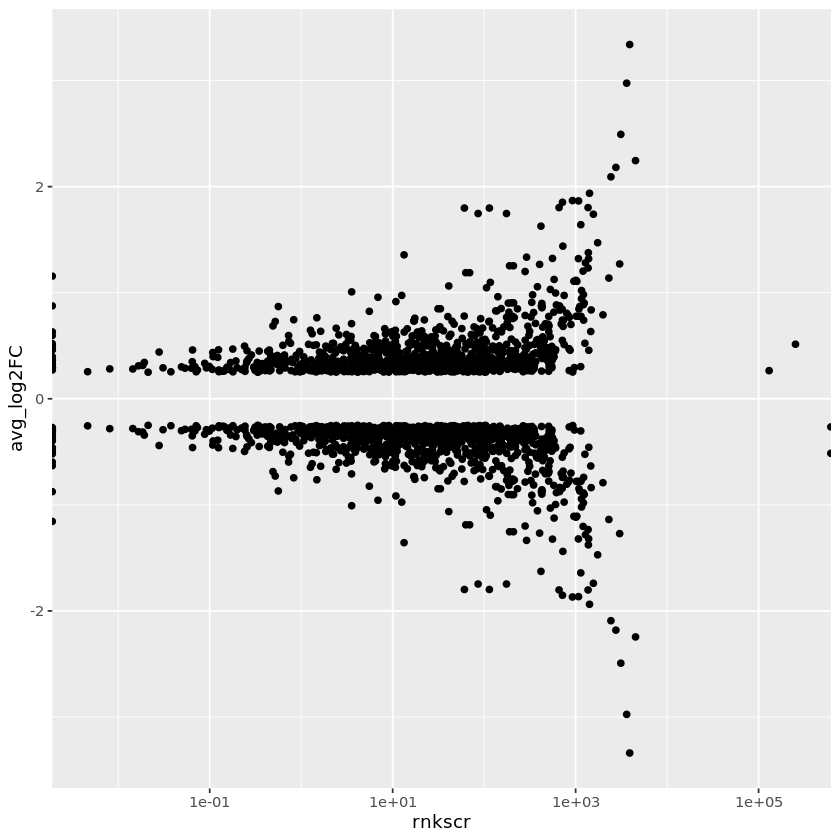

In [140]:
rnkslist[2]

In [160]:
pctslist <- mapply(function(obj,markers) {markers <- markers %>%
	mutate(rnkscr = -log(p_val_adj+1e-310) * sapply(avg_log2FC, as.numeric) * (pct.1 / (pct.2 + 1e-300)))
                                        
    ggplot(markers,aes(x=rnkscr,y=pct.1-pct.2)) + geom_point() + scale_x_continuous(trans='log10')
                                  },
                      typeobjs, wilmarkers, SIMPLIFY = FALSE)

Warning message in self$trans$transform(x):
“NaNs produced”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Removed 116 rows containing missing values (geom_point).”


[[1]]


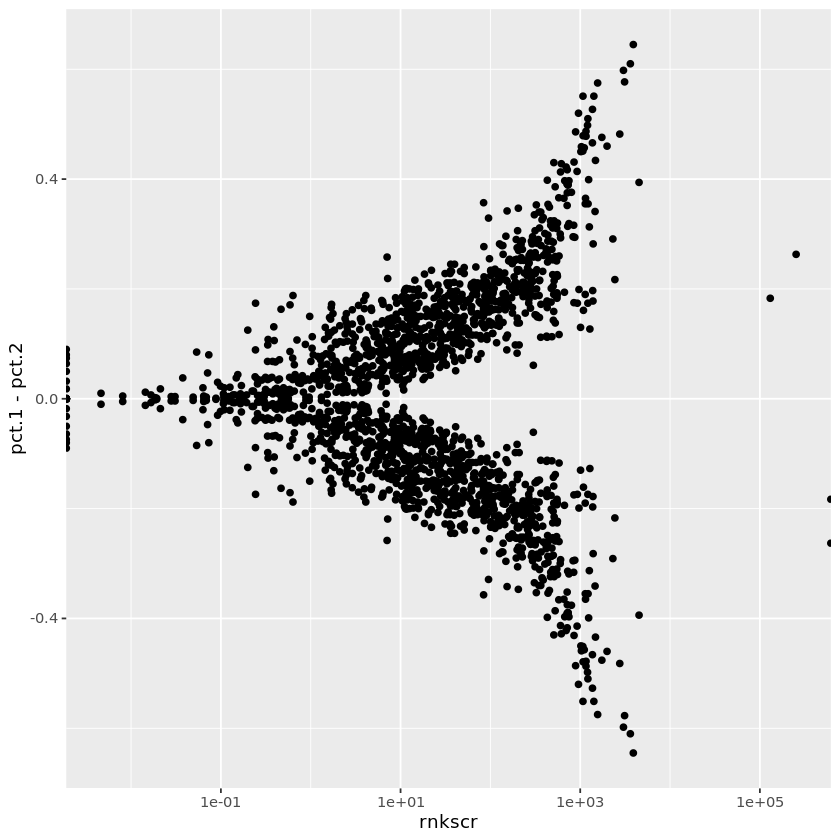

In [161]:
pctslist[2]

In [48]:
wilfilt <- lapply(wilmarkers, function(x) {x<-x %>% filter(avg_log2FC > 0.34, p_val_adj < 0.001) %>% group_by(celltype);return(x)})
class(wilfilt)
class(wilmarkers)

[1] "list"

[1] "list"

In [49]:
install.packages('viridis')
library(viridis)

heatmapslist <- mapply(function(obj,markers) {Top20 <- markers %>%
    filter(pct.1 > 0.25 | pct.2 >0.25) %>%
#	mutate(rnkscr = -log(p_val_adj+1e-310) * sapply(avg_log2FC, as.numeric) * log(1/(pct.1 / (pct.2 + 1e-300)))) %>%
	    group_by(cluster) %>% top_n(20, wt=avg_log2FC) %>% arrange(cluster, desc(avg_log2FC));
	 #   group_by(cluster) %>% top_n(20, wt=rnkscr) %>% arrange(cluster, desc(rnkscr));                                              
                                                                                            
    Idents(obj) <- obj@meta.data$disease
                                              
    DoHeatmap(obj,features=Top20$gene,angle=20,size=2,draw.lines=TRUE,group.colors=c(CD="#FF0000",FGID="#0000FF")) + 
            theme(axis.text.y = element_text(size = 6)) +
            suppressWarnings(scale_fill_gradientn(colors = c("blue", "white", "red"))) +
            ggtitle(sprintf('top markers FGID vs CD %s',obj@meta.data$combinedmajortype %>% unique))
                                             },
                      typeobjs, wilfilt, SIMPLIFY = FALSE)

Installing package into ‘/home/jupyter-user/notebooks/packages’
(as ‘lib’ is unspecified)

Scale for 'fill' is already present. Adding another scale for 'fill', which
will replace the existing scale.

Scale for 'fill' is already present. Adding another scale for 'fill', which
will replace the existing scale.

Scale for 'fill' is already present. Adding another scale for 'fill', which
will replace the existing scale.

Scale for 'fill' is already present. Adding another scale for 'fill', which
will replace the existing scale.

Scale for 'fill' is already present. Adding another scale for 'fill', which
will replace the existing scale.

Scale for 'fill' is already present. Adding another scale for 'fill', which
will replace the existing scale.

Scale for 'fill' is already present. Adding another scale for 'fill', which
will replace the existing scale.

Scale for 'fill' is already present. Adding another scale for 'fill', which
will replace the existing scale.

Scale for 'fill' is already p

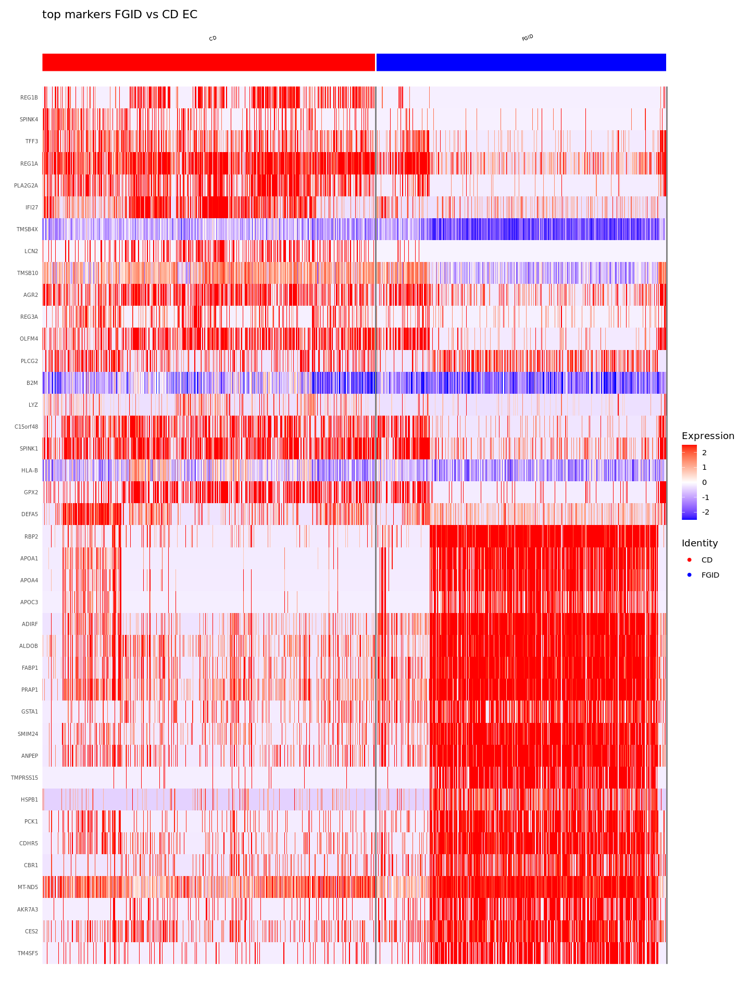

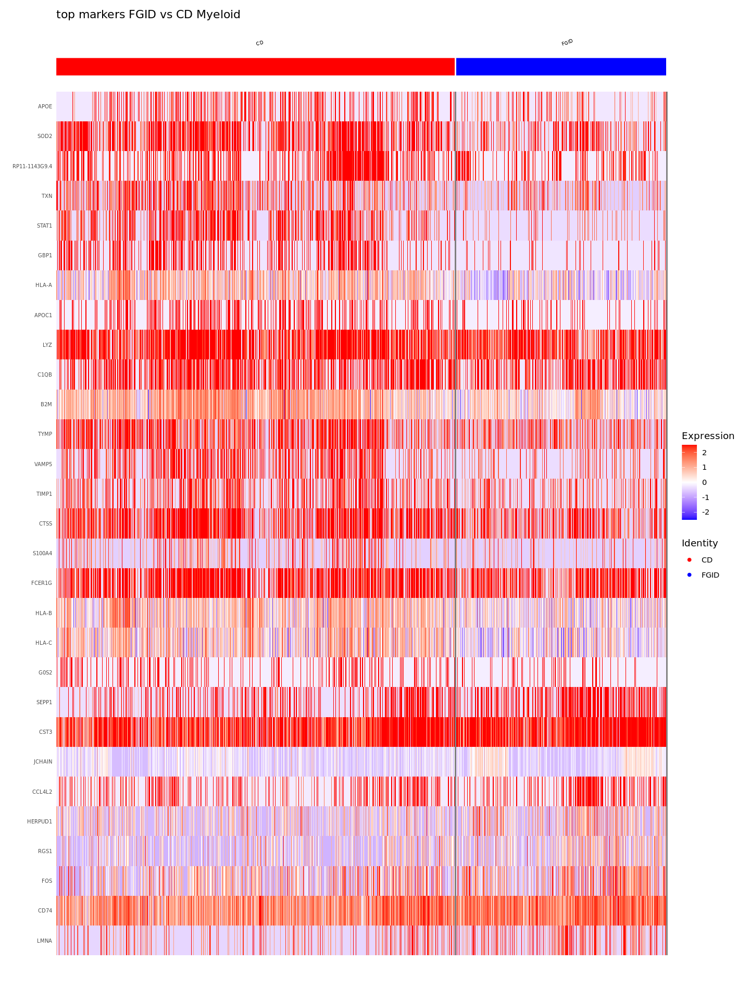

In [50]:
h1 <- heatmapslist[5][[1]]
h2 <- heatmapslist[9][[1]]

h1
h2


In [52]:

OUTDIR='DEfigs'

ggsave(plot=h1, 
       file=file.path(OUTDIR, "heat_EC_FGIDvCD_unified_DE.pdf"), 
       useDingbats=FALSE,
       height=6, width=12)

ggsave(plot=h2, 
       file=file.path(OUTDIR, "heat_mloid_FGIDvCD_unified_DE.pdf"), 
       useDingbats=FALSE,
       height=6, width=12)

#write_csv(wilcfilt,file.path(OUTDIR,"Wilcoxon_diseases_unified_perMajorType.csv"))

system(sprintf('gsutil rsync DEfigs %s/CD14_FGID_combined',Sys.getenv("PREDICT_BUCKET")),intern=T)



character(0)

In [3]:
#Start from here with only CD14 for DE

srobj <- readRDS('./subset_srobj.rds')
cd14sr <- subset(srobj,disease=='CD')
cd14sr



An object of class Seurat 
46176 features across 107432 samples within 2 assays 
Active assay: SCT (22431 features, 3000 variable features)
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

In [3]:
colnames(cd14sr@meta.data)

[1] "CellID"                        "ClusterID"                    
 [3] "ClusterName"                   "SCT_snn_res_0_058"            
 [5] "log1p_nFeatures_RNA_by_counts" "log1p_total_counts"           
 [7] "log1p_total_counts_mito"       "nCount_RNA"                   
 [9] "nCount_SCT"                    "nFeature_RNA"                 
[11] "nFeature_SCT"                  "nFeatures_RNA"                
[13] "nFeatures_RNA_by_counts"       "orig_ident"                   
[15] "pct_counts_mito"               "percent_mt"                   
[17] "seurat_clusters"               "total_counts"                 
[19] "total_counts_mito"             "tier0preds"                   
[21] "cellsubsets"                   "celltypes"                    
[23] "is_doublet"                    "cluster"                      
[25] "orig_idx"                      "tier0ident"                   
[27] "tier1ident"                    "tier2ident"                   
[29] "tier3ident"                    "tier4ident"                   
[31] "tierNident"                    "tier0name"                    
[33] "tier1name"                     "tier2name"                    
[35] "tier3name"                     "tier4name"                    
[37] "tierNname"                     "SampleID"                     
[39] "age"                           "ethnicity"                    
[41] "race"                          "sex"                          
[43] "antiTNF_response"              "inflammation"                 
[45] "disease"                       "patient"                      
[47] "time_point"                    "tissue"                       
[49] "prime"                         "diffexpname"                  
[51] "type"                          "curatedname"                  
[53] "cellname"                      "nFeatures_RNA.by.counts"      
[55] "log1p.nFeatures_RNA.by.counts" "total.counts"                 
[57] "log1p.total.counts"            "total.counts.mito"            
[59] "log1p.total.counts.mito"       "pct.counts.mito"              
[61] "orig.ident"                    "percent.mt"                   
[63] "SCT_snn_res.0.067"             "major10types"                 
[65] "endclust"                      "oldannotations"               
[67] "SCT_snn_res.0.139"

In [8]:
#cd14sr@meta.data$antiTNF_response %>% unique
cd14sr@meta.data$celltypes <- cd14sr@meta.data$celltypes %>% str_replace_all('Tclls','T')%>% str_replace_all('Bclls','B')%>% str_replace_all('Mloid','Myeloid')%>% str_replace_all('IGM_Plsma','Plsma.IGM')%>% str_replace_all('IGG_Plsma_Bcll','IGG.Plsma.B')%>% str_replace_all('IGA_Plsma','Plsma.IGA')%>% str_replace_all('IGA_IGL_Plsma','Plsma.IGA.IGL')%>% str_replace_all('IGA_IGK_Plsma','Plsma.IGA.IGK')%>% str_replace_all('IGG_Plsma','Plsma.IGG')%>% str_replace_all('Epith','EC')

In [9]:
#1v1 FindMarkers method. Since you're specifying ident.1, ident.2, you'll want to include negative values. 
#positive will be upregulated in 1, negative upreg in 2. There is only one comparison done per 1v1

Idents(cd14sr) <- cd14sr@meta.data$antiTNF_response
MasterDE <- data.frame()
tmpDE <- data.frame()
for (celltype in cd14sr@meta.data$celltypes %>% unique) {
    srtmp <- subset(cd14sr,celltypes==celltype)
    Idents(srtmp) <- srtmp@meta.data$antiTNF_response
    NOAvPR <- FindMarkers(srtmp,ident.1='NOA',ident.2='PR') %>% mutate(type=celltype,assay='NOAvPR') %>%
                rownames_to_column('gene')
    FRvPR <- FindMarkers(srtmp,ident.1='RESP',ident.2='PR') %>% mutate(type=celltype,assay='FRvPR') %>%
                rownames_to_column('gene')
    NOAvFR <- FindMarkers(srtmp,ident.1='NOA',ident.2='RESP') %>% mutate(type=celltype,assay='NOAvFR') %>%
                rownames_to_column('gene')
    tmpDE <- bind_rows(NOAvPR,FRvPR,NOAvFR, .id = "id") 
    MasterDE <- bind_rows(MasterDE,tmpDE)
}



In [60]:
##FindAllMarkers method. There are 1v1 comparisons done between each group, per group, so 9 in total.
#positive will be over all other groups, negative under all other groups

Idents(cd14sr) <- cd14sr@meta.data$antiTNF_response
MasterDE <- data.frame()
tmpDE <- data.frame()
for (celltype in cd14sr@meta.data$celltypes %>% unique) {
    srtmp <- subset(cd14sr,celltypes==celltype)
    Idents(srtmp) <- srtmp@meta.data$antiTNF_response
    tmpDE <- FindAllMarkers(srtmp,only.pos=TRUE) %>% mutate(type=celltype)
    MasterDE <- bind_rows(MasterDE,tmpDE)
}



Calculating cluster RESP

Calculating cluster PR

Calculating cluster NOA

Calculating cluster RESP

Calculating cluster PR

Calculating cluster NOA

Calculating cluster RESP

Calculating cluster PR

Calculating cluster NOA

Calculating cluster RESP

Calculating cluster PR

Calculating cluster NOA

Calculating cluster RESP

Calculating cluster PR

Calculating cluster NOA

Calculating cluster RESP

Calculating cluster PR

Calculating cluster NOA

Calculating cluster RESP

Calculating cluster PR

Calculating cluster NOA

Calculating cluster RESP

Calculating cluster PR

Calculating cluster NOA

Calculating cluster RESP

Calculating cluster PR

Calculating cluster NOA

Calculating cluster RESP

Calculating cluster PR

Calculating cluster NOA

Calculating cluster RESP

Calculating cluster PR

Calculating cluster NOA

Calculating cluster RESP

Calculating cluster PR

Calculating cluster NOA



In [61]:
#FindAllMarkers with only.pos =T
MasterDE %>% dim

[1] 1596    8

In [54]:
#FindMarkers 1v1 with only.pos =T
MasterDE %>% dim

[1] 2521    9

In [63]:
#FindMarkers 1v1 without only.pos =T
MasterDE %>% dim

[1] 3864    9

In [58]:
NOAvPR

gene,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,type,assay
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
MTRNR2L12,5.788473e-26,1.0457052,0.574,0.134,1.298412e-21,Paneth,NOAvPR
MT-ND3,5.470854e-24,1.2878730,0.984,0.965,1.227167e-19,Paneth,NOAvPR
IGHM,3.305485e-23,0.8074482,0.726,0.220,7.414534e-19,Paneth,NOAvPR
MTRNR2L1,1.393218e-22,0.5594274,0.326,0.000,3.125128e-18,Paneth,NOAvPR
MTRNR2L8,2.655028e-19,0.7298088,0.495,0.122,5.955493e-15,Paneth,NOAvPR
IGHA1,4.059781e-19,0.3468524,0.847,0.791,9.106496e-15,Paneth,NOAvPR
LYZ,1.139656e-18,1.2620368,0.989,0.980,2.556363e-14,Paneth,NOAvPR
MT-ND1,3.876442e-17,1.0016962,0.984,0.961,8.695248e-13,Paneth,NOAvPR
GUCA2A,7.969189e-15,0.9573642,0.958,0.870,1.787569e-10,Paneth,NOAvPR


In [64]:
#0.58 log2FC ~ 1.5FC, 0.344 ~ 1.29FC ~ 0.25 lnFC (the old standard)
CD14de <- MasterDE %>% filter(avg_log2FC > 0.344, p_val_adj < 0.001) %>% group_by(type)

test <- CD14de 
test$assay <- test$assay %>% str_replace_all('NOAvFR','NOAvPR')

overlapcounts <- test %>% group_by(type,assay) %>% 
                    summarise(n=n_distinct(gene))

cd14counts <- CD14de %>% group_by(type) %>% 
                    #summarise(n=n_distinct(gene))
                     count(assay)

#cd14counts[cd14counts$cluster=='FGID',]$n = -cd14counts[cd14counts$cluster=='FGID',]$n
head(overlapcounts)
head(cd14counts)


`summarise()` has grouped output by 'type'. You can override using the `.groups` argument.



type,assay,n
<chr>,<chr>,<int>
B,FRvPR,26
B,NOAvPR,84
EC,FRvPR,42
EC,NOAvPR,142
Endth,FRvPR,13
Endth,NOAvPR,33


type,assay,n
<chr>,<chr>,<int>
B,FRvPR,26
B,NOAvFR,24
B,NOAvPR,81
EC,FRvPR,42
EC,NOAvFR,129
EC,NOAvPR,27


In [65]:
CD14de <- MasterDE %>% filter(p_val_adj < 0.001)
#Stringent filtering
#CD14de <- MasterDE %>% filter(abs(avg_log2FC) > 0.58, p_val_adj < 0.001)
cd14counts <- CD14de %>% group_by(type,assay) %>% 
                     mutate(pos=sum(avg_log2FC>0),neg=sum(avg_log2FC<0)) %>%
                    select(type,assay,pos,neg) %>% unique

##VERY IMPORTANT HERE:::! 
##set positive counts to negative values, so that 
##the genes upregulated in the first variable are leftwards on the graph
cd14counts <- cd14counts %>% mutate(pos=-pos) %>% pivot_longer(cols=c('pos','neg'),names_to='up_down',values_to='n')
cd14counts

type,assay,up_down,n
<chr>,<chr>,<chr>,<int>
T,NOAvPR,pos,-56
T,NOAvPR,neg,23
T,FRvPR,pos,-22
T,FRvPR,neg,3
T,NOAvFR,pos,-41
T,NOAvFR,neg,31
Plsma.IGA.IGL,NOAvPR,pos,-143
Plsma.IGA.IGL,NOAvPR,neg,1
Plsma.IGA.IGL,FRvPR,pos,-60


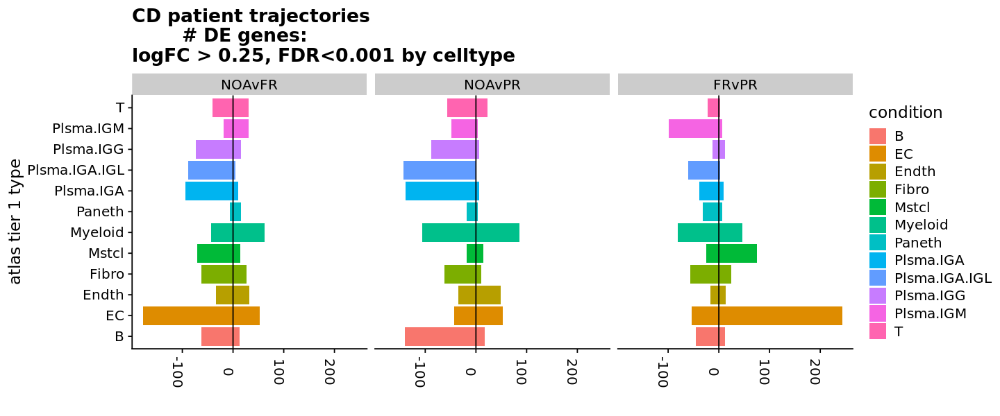

In [66]:
##Here's the correct directional

options(repr.plot.width=12, repr.plot.height=5)

sb1 <- ggplot(cd14counts %>% group_by(type) %>%
              mutate(assay = fct_relevel(assay,'NOAvFR','NOAvPR','FRvPR')),
              aes(x=type,fill=type,y=n,group=celltype)) + 
        geom_col() +
        #scale_fill_manual(values=c(NOA="#FF0000",PR="#0000FF")) +
        theme_cowplot() + 
       # scale_y_continuous(limits=c(-100,100)) +
        coord_flip() +
        ylab("") + 
        xlab('atlas tier 1 type') +
        facet_wrap(~assay) +
        geom_hline(yintercept = 0) +
        theme(axis.text.x=element_text(angle=270))+
        ggtitle('CD patient trajectories\n        # DE genes:\nlogFC > 0.25, FDR<0.001 by celltype') +
        guides(fill=guide_legend(title="condition"))

sb1

Warning message:
“Unknown levels in `f`: FRvPR”


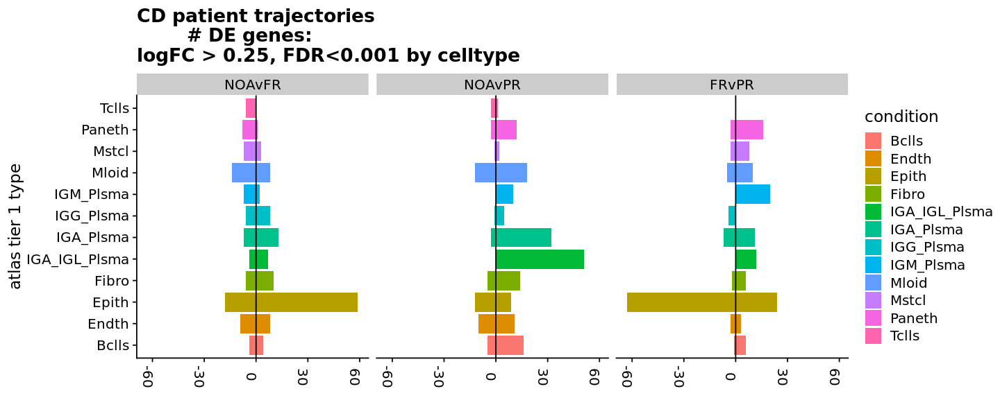

In [111]:
#In the incorrect directional seen here, I set negative logFC to negative 
#(those correspond to a lack from the left group to the right)
#which actually should be an increase on the right, more intuitively on the graph.

options(repr.plot.width=12, repr.plot.height=5)

sbxx <- ggplot(cd14counts %>% group_by(type) %>%
              mutate(assay = fct_relevel(assay,'NOAvFR','NOAvPR','FRvPR')),
              aes(x=type,fill=type,y=n,group=celltype)) + 
        geom_col() +
        #scale_fill_manual(values=c(NOA="#FF0000",PR="#0000FF")) +
        theme_cowplot() + 
       # scale_y_continuous(limits=c(-100,100)) +
        coord_flip() +
        ylab("") + 
        xlab('atlas tier 1 type') +
        facet_wrap(~assay) +
        geom_hline(yintercept = 0) +
        theme(axis.text.x=element_text(angle=270))+
        ggtitle('CD patient trajectories\n        # DE genes:\nlogFC > 0.25, FDR<0.001 by celltype') +
        guides(fill=guide_legend(title="condition"))

sbxx

In [67]:
OUTDIR='DEfigs'

ggsave(plot=sb1, 
       file=file.path(OUTDIR, "SideBar_DEcounts_antiTNFpairwise_perTCATopLevelAnnotations.pdf"), 
       useDingbats=FALSE,
       height=8, width=18)

write_csv(MasterDE %>% select(-id),file.path(OUTDIR,'DE_CD14_antiTNFpairwise_perTCATopLevelAnnotation.csv'))

system(sprintf('gsutil rsync DEfigs %s/CD14_antiTNF_Traditional', Sys.getenv("PREDICT_BUCKET")),intern=T)




character(0)

In [11]:
OUTDIR='DEfigs'
write_csv(MasterDE %>% filter(assay=='NOAvFR') %>% select(-id,-assay),file.path(OUTDIR,'DE_CD14_antiTNF_NOAvFR_perTCATopLevelAnnotation.csv'))
write_csv(MasterDE %>% filter(assay=='NOAvPR') %>% select(-id,-assay),file.path(OUTDIR,'DE_CD14_antiTNF_NOAvPR_perTCATopLevelAnnotation.csv'))
write_csv(MasterDE %>% filter(assay=='FRvPR') %>% select(-id,-assay),file.path(OUTDIR,'DE_CD14_antiTNF_FRvPR_perTCATopLevelAnnotation.csv'))

system(sprintf('gsutil rsync DEfigs %s/CD14_antiTNF_Traditional', Sys.getenv("PREDICT_BUCKET")),intern=T)


character(0)

In [10]:
MasterDE %>% filter(assay=='NOAvPR') %>% select(-id,-assay)

gene,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,type
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
IFI44L,0.000000e+00,0.3857511,0.197,0.018,0.000000e+00,T
IGKC,0.000000e+00,-0.8162880,0.697,0.939,0.000000e+00,T
JCHAIN,0.000000e+00,-0.4502805,0.362,0.558,0.000000e+00,T
RPS10,0.000000e+00,0.7552345,0.730,0.489,0.000000e+00,T
EEF1A1,0.000000e+00,0.4778802,0.999,0.997,0.000000e+00,T
RPL30,0.000000e+00,0.4584961,0.983,0.932,0.000000e+00,T
RPLP2,0.000000e+00,0.4868197,0.998,0.988,0.000000e+00,T
MALAT1,0.000000e+00,0.4797024,0.999,0.999,0.000000e+00,T
IGHA1,0.000000e+00,-0.7634392,0.400,0.813,0.000000e+00,T


Warning message:
“Unknown levels in `f`: NOAvFR, NOAvPR”
Warning message:
“Unknown levels in `f`: NOAvPR, FRvPR”
Warning message:
“Unknown levels in `f`: NOAvFR, FRvPR”
Warning message:
“Unknown levels in `f`: NOAvFR, NOAvPR”
Warning message:
“Unknown levels in `f`: NOAvPR, FRvPR”
Warning message:
“Unknown levels in `f`: NOAvFR, FRvPR”
Warning message:
“Unknown levels in `f`: NOAvFR, NOAvPR”
Warning message:
“Unknown levels in `f`: NOAvPR, FRvPR”
Warning message:
“Unknown levels in `f`: NOAvFR, FRvPR”
Warning message:
“Unknown levels in `f`: NOAvFR, NOAvPR”
Warning message:
“Unknown levels in `f`: NOAvPR, FRvPR”
Warning message:
“Unknown levels in `f`: NOAvFR, FRvPR”
Warning message:
“Unknown levels in `f`: NOAvFR, NOAvPR”
Warning message:
“Unknown levels in `f`: NOAvPR, FRvPR”
Warning message:
“Unknown levels in `f`: NOAvFR, FRvPR”
Warning message:
“Unknown levels in `f`: NOAvFR, NOAvPR”
Warning message:
“Unknown levels in `f`: NOAvPR, FRvPR”
Warning message:
“Unknown levels in `f`: N

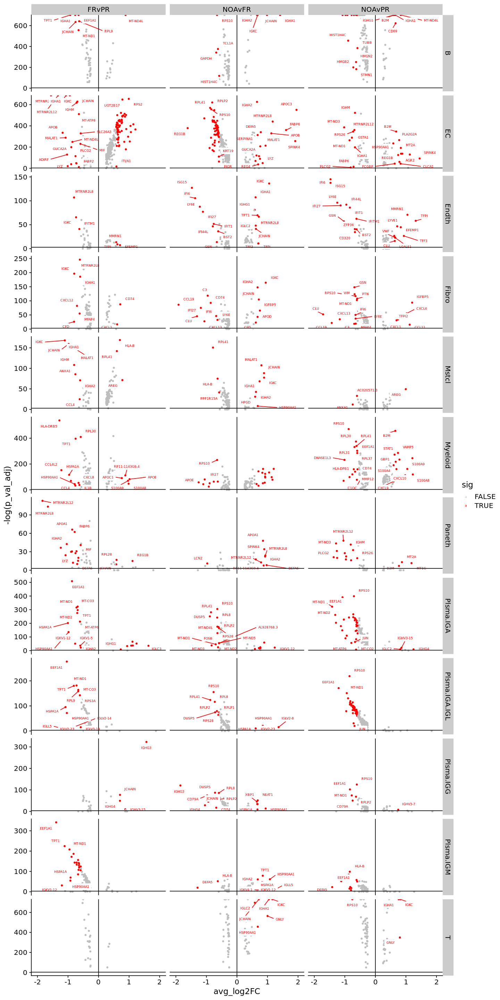

In [69]:
library(ggrepel)
options(repr.plot.width=12, repr.plot.height=24)


#CD14de <- MasterDE %>% filter(abs(avg_log2FC) > 0.58, p_val_adj < 0.001)

#I use pct.1 > 0.2, pct.2 > 0.2 when I want to label genes that I will use in heatmaps
MasterDE2 <- MasterDE %>% group_by(type) %>% mutate(sig = ifelse(abs(avg_log2FC) > 0.58 & 
                                                                 p_val_adj <0.001,
#                                                                 pct.1 > 0.2 &
#                                                                 pct.2 > 0.2, 
                                                                 TRUE, FALSE))

##VERY IMPORTANT HERE:::! 
##set positive counts to negative values, so that 
##the genes upregulated in the first variable are leftwards on the graph
MasterDE2 <- MasterDE2 %>% group_by(type,assay) %>% 
                     mutate(avg_log2FC=-avg_log2FC)


#CD14defilt <- CD14de %>% filter(pct.1>0.2,pct.2>0.2)
v1 <- ggplot(MasterDE2 %>%
              mutate(assay = fct_relevel(assay,'NOAvFR','NOAvPR','FRvPR'))) +
    geom_point(aes(y=-log(p_val_adj), x=avg_log2FC,color=sig),size=1) +
    ggrepel::geom_label_repel(data=MasterDE2 %>% filter(sig==TRUE),aes(y=-log(p_val_adj),
                   x=avg_log2FC,
                    color=sig,
                   label=gene),
                  label.size=NA,
               size=2) +
    facet_grid(type ~ assay,scale='free_y') +
    scale_color_manual(values=c("grey", "red")) +
    geom_vline(xintercept = 0) +
    geom_hline(yintercept = -log(0.05)) +
    xlim(c(-2, 2)) +
    cowplot::theme_cowplot()
v1

In [70]:
OUTDIR='DEfigs'

ggsave(plot=sb1, 
       file=file.path(OUTDIR, "SideBar_DEcounts_antiTNFpairwise_perTCATopLevelAnnotations.pdf"), 
       useDingbats=FALSE,
       height=8, width=18)

ggsave(plot=v1, 
       file=file.path(OUTDIR, "Volcano_DE_antiTNFpairwise_perTCATopLevelAnnotations.pdf"), 
       useDingbats=FALSE,
       height=24, width=12)

write_csv(MasterDE2 %>% select(-id),file.path(OUTDIR,'DE_CD14_antiTNFpairwise_perTCATopLevelAnnotation_NegIdent1_PosIdent2.csv'))

system(sprintf('gsutil rsync DEfigs %s/CD14_antiTNF_Traditional', Sys.getenv("PREDICT_BUCKET")),intern=T)




Warning message:
“Removed 14 rows containing missing values (geom_point).”
Warning message:
“Removed 12 rows containing missing values (geom_label_repel).”
Warning message:
“ggrepel: 62 unlabeled data points (too many overlaps). Consider increasing max.overlaps”
Warning message:
“ggrepel: 1 unlabeled data points (too many overlaps). Consider increasing max.overlaps”
Warning message:
“ggrepel: 8 unlabeled data points (too many overlaps). Consider increasing max.overlaps”
Warning message:
“ggrepel: 5 unlabeled data points (too many overlaps). Consider increasing max.overlaps”
Warning message:
“ggrepel: 14 unlabeled data points (too many overlaps). Consider increasing max.overlaps”
Warning message:
“ggrepel: 57 unlabeled data points (too many overlaps). Consider increasing max.overlaps”
Warning message:
“ggrepel: 19 unlabeled data points (too many overlaps). Consider increasing max.overlaps”
Warning message:
“ggrepel: 1 unlabeled data points (too many overlaps). Consider increasing max.ov

character(0)

In [56]:
###GSEA
BiocManager::install("fgsea")
library(fgsea)

Bioconductor version 3.12 (BiocManager 1.30.10), R 4.0.3 (2020-10-10)

Installing package(s) 'fgsea'

also installing the dependency ‘fastmatch’


Old packages: 'BiocManager', 'boot', 'broom', 'cachem', 'callr', 'caTools',
  'cli', 'cluster', 'cpp11', 'data.table', 'dbplyr', 'DelayedArray', 'deldir',
  'desc', 'DESeq2', 'devtools', 'diffobj', 'dplyr', 'farver', 'formatR',
  'gargle', 'GenomeInfoDb', 'GenomicFeatures', 'gert', 'gh', 'googleAuthR',
  'isoband', 'lifecycle', 'lubridate', 'MASS', 'mgcv', 'mime', 'parallelly',
  'pillar', 'pkgload', 'processx', 'promises', 'ps', 'RcppArmadillo', 'RCurl',
  'remotes', 'reprex', 'rmarkdown', 'RSQLite', 'rvest', 'Seurat', 'spatstat',
  'spatstat.data', 'spatstat.utils', 'survival', 'testthat', 'tibble', 'tidyr',
  'tinytex', 'utf8', 'vctrs', 'waldo', 'xfun', 'XML', 'zoo'



In [58]:
#system(sprintf('gsutil cp %s/CD14_FGID_combined/GSEAlists/c7.all.v7.2.symbols.gmt .',Sys.getenv("PREDICT_BUCKET")))
pathways.c7 <- gmtPathways("./c7.all.v7.2.symbols.gmt")


In [79]:
res <- MasterDE %>% filter(type=='Epith')
topPathsPerAssay <- list()
#c7done <- tibble()
for (DEres in unique(res$assay)) {
    de <- res %>% filter(assay==DEres)
    ranks <- de %>% select(gene,avg_log2FC) %>% 
    mutate(rank=rank(avg_log2FC,ties.method='random')) %>% 
    select(-avg_log2FC) %>%
    deframe
    c7gsea <- fgsea(pathways=pathways.c7,stats=ranks)
    
    #Plot top pathways
    topPathwaysUp <- c7gsea[ES > 0][head(order(pval), n=10), pathway]
    topPathwaysDown <- c7gsea[ES < 0][head(order(pval), n=10), pathway]
    topPathways <- c(topPathwaysUp, rev(topPathwaysDown)) %>% data.frame
    topPathways$assay <- DEres
    topPathsPerAssay <- bind_rows(topPathsPerAssay,topPathways)
    #plotGseaTable(pathways.c7[topPathways], ranks, c7gsea, 
    #          gseaParam=0.5)
    #gseaplots <- c(gseaplots,plt)
    #Produce tidy results table with all three assays
    c7tidy <- c7gsea %>% as_tibble() %>% arrange(desc(NES)) %>% data.frame
    c7tidy$assay <- DEres
    c7done <- bind_rows(c7done,c7tidy)
}

#head(c7done)



Warning message in preparePathwaysAndStats(pathways, stats, minSize, maxSize, gseaParam, :
“All values in the stats vector are greater than zero and scoreType is "std", maybe you should switch to scoreType = "pos".”
Warning message in preparePathwaysAndStats(pathways, stats, minSize, maxSize, gseaParam, :
“All values in the stats vector are greater than zero and scoreType is "std", maybe you should switch to scoreType = "pos".”
Warning message in fgseaMultilevel(...):
“There were 18 pathways for which P-values were not calculated properly due to unbalanced (positive and negative) gene-level statistic values. For such pathways pval, padj, NES, log2err are set to NA. You can try to increase the value of the argument nPermSimple (for example set it nPermSimple = 10000)”
Warning message in fgseaMultilevel(...):
“For some of the pathways the P-values were likely overestimated. For such pathways log2err is set to NA.”
Warning message in preparePathwaysAndStats(pathways, stats, minSize, maxSi

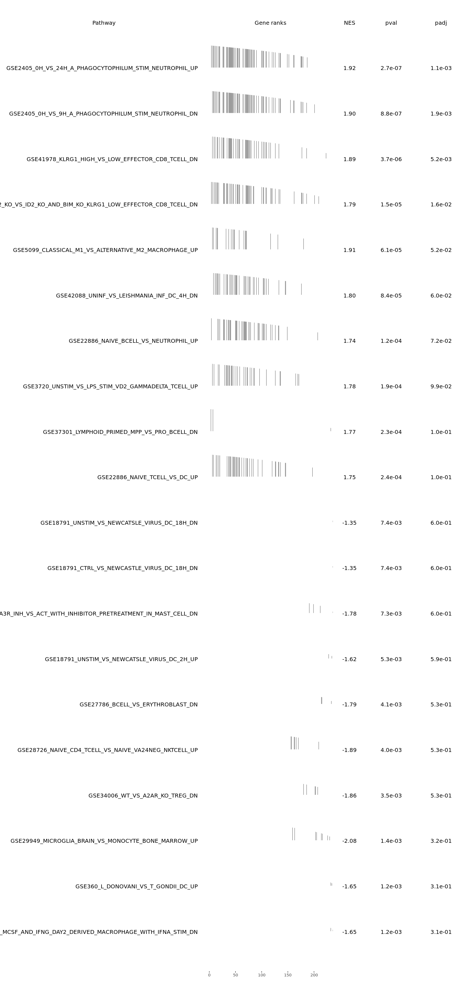

In [99]:
options(repr.plot.width=14, repr.plot.height=30)

plotGseaTable(pathways.c7[topPathsPerAssay %>% rename(path = '.') %>% filter(assay=='NOAvFR') %>% pull(path)], ranks, c7gsea, 
              gseaParam=0.5)
#topPathsPerAssay
#topPathsPerAssay %>%

In [62]:
head(CD14de)

,id,gene,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,type,assay
,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
1,1,IGKC,0.000000e+00,-0.8162880,0.697,0.939,0.000000e+00,Tclls,NOAvPR
2,1,RPS10,0.000000e+00,0.7552345,0.730,0.489,0.000000e+00,Tclls,NOAvPR
3,1,IGHA1,0.000000e+00,-0.7634392,0.400,0.813,0.000000e+00,Tclls,NOAvPR
4,1,GNLY,9.721174e-157,-0.8013095,0.040,0.127,2.180557e-152,Tclls,NOAvPR
5,3,IGKC,0.000000e+00,-1.1572879,0.697,0.956,0.000000e+00,Tclls,NOAvFR
6,3,JCHAIN,0.000000e+00,-0.7171652,0.362,0.686,0.000000e+00,Tclls,NOAvFR


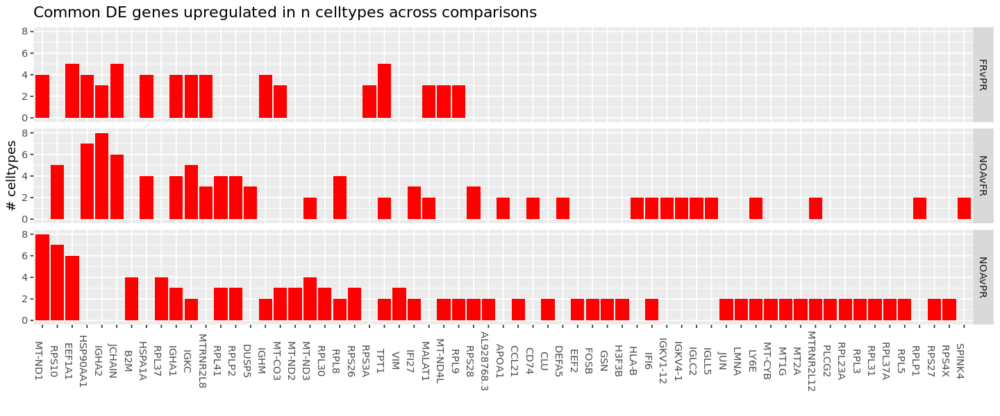

In [12]:
options(repr.plot.width=12, repr.plot.height=5)

test <- MasterDE2 %>% ungroup %>% filter(sig==TRUE) %>% count(assay,gene)
b1 <- ggplot(test %>% group_by(assay) %>% arrange(desc(n)) %>% top_n(n=15,n), aes(x=reorder(gene,-n),y=n)) +
    geom_col(fill='red') +
    facet_grid(assay~.) + 
    theme(axis.text.x=element_text(angle=270)) +
    xlab('') +
    ylab('# celltypes') +
    ggtitle('Common DE genes upregulated in n celltypes across comparisons')

b1

In [13]:
OUTDIR='DEfigs'

ggsave(plot=v1, 
       file=file.path(OUTDIR, "Volcano_DE_antiTNFpairwise_perTCATopLevelAnnotations.pdf"), 
       useDingbats=FALSE,
       height=24, width=12)

ggsave(plot=b1, 
       file=file.path(OUTDIR, "Bars_commonDEgenes_amongcelltypes_antiTNFpairwise_TCATopLevelAnnotations.pdf"), 
       useDingbats=FALSE,
       height=5, width=12)

system(sprintf('gsutil rsync DEfigs %s/CD14_antiTNF_Traditional', Sys.getenv("PREDICT_BUCKET")),intern=T)




Warning message:
“Removed 14 rows containing missing values (geom_point).”
Warning message:
“Removed 12 rows containing missing values (geom_label_repel).”
Warning message:
“ggrepel: 62 unlabeled data points (too many overlaps). Consider increasing max.overlaps”
Warning message:
“ggrepel: 5 unlabeled data points (too many overlaps). Consider increasing max.overlaps”
Warning message:
“ggrepel: 14 unlabeled data points (too many overlaps). Consider increasing max.overlaps”
Warning message:
“ggrepel: 1 unlabeled data points (too many overlaps). Consider increasing max.overlaps”
Warning message:
“ggrepel: 8 unlabeled data points (too many overlaps). Consider increasing max.overlaps”
Warning message:
“ggrepel: 57 unlabeled data points (too many overlaps). Consider increasing max.overlaps”
Warning message:
“ggrepel: 6 unlabeled data points (too many overlaps). Consider increasing max.overlaps”
Warning message:
“ggrepel: 2 unlabeled data points (too many overlaps). Consider increasing max.ove

character(0)